In [1]:
import sys
sys.path.append("../../")

from astronn.datasets import deltascuti, bedding, corot ,starmodels
from astronn import models

import tensorflow as tf
from tensorflow import keras

import numpy as np
import math
import pandas as pd
import shap
from scipy.signal import find_peaks, peak_widths
import pickle
import itertools
from pygam import LogisticGAM, s, f, te

from sklearn.mixture import GaussianMixture
import matplotlib

from sklearn.metrics import confusion_matrix, classification_report

import matplotlib.pyplot as plt

Using TensorFlow backend.


### Some examples of star models

In [2]:
bedding_stars = bedding()
df_bedding = bedding_stars.load("../data/bedding/preprocessed/*", batch_size=1)
if False:
    for star in df_bedding.take(10):
        #print(np.where(star[1]==1))
        plt.plot(star[1][0, :, 0])
        plt.plot(star[1][0, :, 1])
        #plt.plot(star[1][0, :, 2], alpha=0.5)
        plt.show()

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the ver

In [3]:
df = starmodels().load("/home/roberto/Downloads/evolutionTracks_line/parts_train/*", batch_size=1, add_noise=False)
if False:
    for star in df.take(20):
        #print(star[0])
        print(np.where(star[1]==1))
        plt.plot(star[0][0, :, 0])
        plt.plot(star[0][0, :, 1])
        #plt.plot(star[0][0, :, 2], alpha=0.5)
        plt.show()

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

In [4]:
df_ds = deltascuti()
df_start = df_ds.load("../../astronn/data/deltascuti/preprocessed/*", batch_size=1)
if False:
    for star in df_start.take(10):
        #print(np.where(star[1]==1))
        print(star[0])
        plt.plot(star[1][0, :, 0])
        plt.plot(star[1][0, :, 1])
        #plt.plot(star[1][0, :, 2], alpha=0.5)
        plt.show()

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the ver

#### Calculate means and sd from data

In [5]:
if False:
    star_ac_values = [star[0][0, :, 1].numpy() for star in df.take(77)]
    print("Models- mean:%f sd:%f" % (np.median(star_ac_values), np.std(star_ac_values)))
    print("-----------------------------------------------------------------------------")
    bs_ac_values = [star[1][0, :, 1] for star in df_start.take(10)]
    print("11BS  - mean:%f sd:%f" % (np.median(bs_ac_values), np.std(bs_ac_values)))
    bedding_ac_values = [star[1][0, :, 1] for star in df_bedding.take(77)]
    print("Bedd  - mean:%f sd:%f" % (np.median(bedding_ac_values), np.std(bedding_ac_values)))

    plt.hist([item for sublist in star_ac_values for item in sublist], bins=100)
    plt.hist([item for sublist in bs_ac_values for item in sublist], bins=100)
    plt.show()

    plt.hist([item for sublist in star_ac_values for item in sublist], bins=100)
    plt.hist([item for sublist in bedding_ac_values for item in sublist], bins=100)
    plt.show()

In [6]:
if False:
    star_ac_values = [star[0][0, :, 0] for star in df.take(77)]
    print("Models- mean:%f sd:%f" % (np.median(star_ac_values), np.std(star_ac_values)))
    print("-----------------------------------------------------------------------------")
    bs_ac_values = [star[1][0, :, 0] for star in df_start.take(10)]
    print("11BS  - mean:%f sd:%f" % (np.median(bs_ac_values), np.std(bs_ac_values)))
    bedding_ac_values = [star[1][0, :, 0] for star in df_bedding.take(77)]
    print("Bedd  - mean:%f sd:%f" % (np.median(bedding_ac_values), np.std(bedding_ac_values)))

In [7]:
if False:
    #### plt.hist([item for sublist in star_ac_values for item in sublist], bins=100)
    plt.hist([item for sublist in bs_ac_values for item in sublist], bins=100)
    plt.show()

    plt.hist([item for sublist in star_ac_values for item in sublist], bins=100)
    plt.hist([item for sublist in bedding_ac_values for item in sublist], bins=100)
    plt.show()

### The next Period-Luminosity relation is obtained by using the data provided in McNamara (2011):

$\log_{10} \text{L}_\odot = 1.4722 (0.100) \log_{10} \text{P} + 2.6089 (0.096)$

&nbsp;
&nbsp;


### Period (variable $\text{P}$) is isolated to obtained its value given the Luminosity.

$\log_{10} \text{L}_\odot - 2.6089 (0.096) = 1.4722 (0.100) \log_{10} \text{P}$

$\log_{10} \text{P} = \Large\frac{\log_{10} \text{L}_\odot - 2.6089 (0.096)}{1.4722 (0.100)}$

$\text{P} = 10\Large^{\Large\frac{\log_{10} \text{L}_\odot - 2.6089 (0.096)}{1.4722 (0.100)}}$

&nbsp;

The fundamental radial mode $\text{P}_0$ is related to the mean density by the pulsation constant $\text{Q} = \text{P} \cdot \Large\sqrt{\frac{\rho}{\rho_\odot}}$ (see Breger, 1990). For $\text{P}_0$ the value of $\text{Q} = [0.03, 0.0492] \text{ (days)}$

Thus, by isolating $\frac{\rho}{\rho_\odot}$ in the above equation and given the value of $\text{P}$, we have a direct estimation of the mean density, as follows:

&nbsp;

$\Large\frac{\rho}{\rho_\odot} = \Big( \frac{Q}{P}\Big)^2$

In [8]:
def get_log_l(P, A=1.4722, e_A=0.1, B=2.6089, e_B=0.096):
    """
    P-L relation for McNamara (2011)
    """
    return A * np.log10(P) + B


def get_P(log_L, A=1.4722, e_A=0.1, B=2.6089, e_B=0.096):
    """
    P variable isolated from log_L relation
    """
    return np.power(10, (log_L - B) / (A))

def get_rho_from_P(P, Q=0.033):
    """
    """
    return np.power(Q/P, 2)

# Example
P = 2.34
log_l = get_log_l(P=P)
P_equation = get_P(log_L=log_l)
print("P value = %f" % P)
print("log L is equal to %f" % log_l)
print("P from equation %f" % P_equation)
# Assert results
np.testing.assert_almost_equal(P, P_equation)

P value = 2.340000
log L is equal to 3.152460
P from equation 2.340000


### Relate to the error, we use a standard error propagation to calculate it:

$\Delta P = \sqrt{\Big(\frac{\delta \text{P}}{\delta \text{A}}\Delta\text{A}\Big)^2  +  \Big(\frac{\delta \text{P}}{\delta \text{B}}\Delta\text{B}\Big)^2   +    \Big(\frac{\delta \text{P}}{\delta \text{L}}\Delta\text{L}\Big)^2}$ where $A = 1.4722$ with uncertainty $\Delta A = 0.100$ and $B = 2.6089$ with uncertainty $\Delta B = 0.096$

$\Delta P = \sqrt{ \Big( 10^{\frac{\text{L}_\odot - B}{A}}  * (2.30258509 * A^2) * \text{L}_\odot * \Delta A \Big)^2 + \Big( 10^{\frac{\text{L}_\odot - B}{A}}  * (2.30258509 * A) *  \Delta B \Big)^2}$


&nbsp;

## Range of $\rho$ used through PL relation

To calculate a valid PL window, we will use the next range:

$\Large[ \frac{\rho}{\rho_\odot}_{\min} = \Big( \frac{0.033}{P+\Delta_p}\Big)^2, \frac{\rho}{\rho_\odot}_{\max} = \Big( \frac{0.042}{P-\Delta_p}\Big)^2 \Large]$

In [9]:
def p_error(log_L, A=1.4722, e_A=0.1, B=2.6089, e_B=0.096):
    """
    """
    return np.sqrt(
        np.power(
            np.power(10, (log_L - B) / A) * (2.30258509 / np.power(A, 2)) * log_L * e_A,
            2,
        )
        + np.power(np.power(10, (log_L - B) / A) * (2.30258509 / A) * e_B, 2)
    )


l_value = 1.3
print(
    "Period for L=%f is equal to %f +-(%f)"
    % (l_value, get_P(log_L=1.3), p_error(log_L=1.3))
)

Period for L=1.300000 is equal to 0.129099 +-(0.026337)


### Relation Rodriguez-Martin et.al. 2020

$\frac{\bar{\rho}}{\rho} = 1.6^{+0.5}_{-0.4} \Big( \langle\Delta\nu\rangle / \Delta\nu_\odot \Big)^{2.02^{+0.10}_{-0.10}}$

For the moment, we will use a simetric error in the first term i.e.: $1.6^{+0.5}_{-0.5}$

$\Delta \frac{\bar{\rho}}{\rho} = \sqrt{\Big(\frac{\delta \frac{\bar{\rho}}{\rho}}{\delta \text{A}}\Delta\text{A}\Big)^2  +  \Big(\frac{\delta \frac{\bar{\rho}}{\rho}}{\delta \text{B}}\Delta\text{B}\Big)^2 }$ where $A = 1.6$ with uncertainty $\Delta A = 0.5$ and $B = 2.02$ with uncertainty $\Delta B = 0.1$

$\Delta \frac{\bar{\rho}}{\rho}  = \sqrt{ ( {\langle\Delta\nu\rangle / \Delta\nu_\odot} )^B * \Delta \text{A} )^2 +  (A * ( {\langle\Delta\nu\rangle / \Delta\nu_\odot} )^B + \log_{10}(x) * \Delta B)^2 }$


&nbsp;
&nbsp;

Inversely, we can get $\Delta \nu$ from $\rho$ as follows:

$\langle\Delta\nu\rangle / \Delta\nu_\odot = \Big( \frac{\frac{\bar{\rho}}{\rho}}{1.6^{+0.5}_{-0.4}} \Big)^{\big(2.02^{+0.10}_{-0.10} \big)^{-1}}$

$\langle\Delta\nu\rangle / \Delta\nu_\odot = \sqrt{\Big(\frac{\delta \langle\Delta\nu\rangle / \Delta\nu_\odot}{\delta \text{A}}\Delta\text{A}\Big)^2  +  \Big(\frac{\delta \langle\Delta\nu\rangle / \Delta\nu_\odot}{\delta \text{B}}\Delta\text{B}\Big)^2 }$ where $A = 1.6$ with uncertainty $\Delta A = 0.5$ and $B = 2.02$ with uncertainty $\Delta B = 0.1$

$\langle\Delta\nu\rangle / \Delta\nu_\odot = \sqrt{  -(Y * 1/(\ln(B) * Y/A) * \Delta A)^2 + (-\log(Y/A)*1/B/\ln(B)^2 * \Delta B)^2 }$



In [10]:
def get_rho(delta_nu):
    """
    """
    return 1.6 * np.power(delta_nu, 2.02)


def rho_error(delta_nu, A=1.6, e_A=0.5, B=2.02, e_B=0.1):
    """
    """
    return np.sqrt(
        np.power(np.power(delta_nu, B) * e_A, 2) 
        + np.power(A * np.power(delta_nu, B) * np.log10(delta_nu) * e_B, 2)
    )

delta_nu_value = 1.3
print(
    "Delta_nu == %f is a rho equal to %f +-(%f)"
    % (l_value, get_rho(delta_nu=delta_nu_value), rho_error(delta_nu=delta_nu_value))
)

Delta_nu == 1.300000 is a rho equal to 2.718226 +-(0.850010)


In [11]:
def get_dnu_from_rho(rho):
    """
    """
    return math.pow(rho / 1.6, math.pow(2.02, -1))


def dnu_error(rho, A=1.6, e_A=0.0, B=2.02, e_B=0.1):
    """
    """
    return np.sqrt(
        math.pow(
            -math.pow(rho / A, 1 / B - 1) * (1 / B / math.pow(A, 2)) * rho * e_A, 2
        )
        + math.pow(
            -math.pow(rho / A, 1 / B)
            / math.pow(B, 2)
            * math.log(rho / A, math.e)
            * e_B,
            2,
        )
    )

rho = 2.718226
print(
    "rho == %f is a Delta_nu equal to %f +-(%f)"
    % (rho, get_dnu_from_rho(rho=rho), dnu_error(rho=rho))
)

# Assert results
np.testing.assert_almost_equal(get_dnu_from_rho(rho=rho), delta_nu_value)

rho == 2.718226 is a Delta_nu equal to 1.300000 +-(0.016885)


In [12]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '--', label="x "+str(slope))

#### Load pre-trained NN model

In [13]:
# Load model
#sepconv_mod = tf.keras.models.load_model("/home/roberto/Projects/sepconvnn_tmp_400/")
#sepconv_mod = tf.keras.models.load_model("/home/roberto/Projects/sepconvnn_tmp_400_2/")
#sepconv_mod = tf.keras.models.load_model("/home/roberto/Projects/sepconvnn_tmp_dos_200/")
#sepconv_mod = tf.keras.models.load_model("/tmp/sepconvnn_tmp_dos_500/")
sepconv_mod = tf.keras.models.load_model("/home/roberto/Projects/best_train/sepconvnn_tmp_dos_200/")

sepconv_mod.summary() 

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 351, 10)           1010      
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 342, 10)           1010      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 68, 10)            0         
_________________________________________________________________
batch_normalization (BatchNo (None, 68, 10)            40        
_________________________________________________________________
flatten (Flatten)            (None, 680)               0         
_________________________________________________________________
dense (Dense)                (None, 100)               68100     
Total params: 70,160
Trainable params: 70,140
Non-trainable params: 20
___________________________________________________

## Read an process 11 binaries DS

##### Calculate Luminosity

In [14]:
csv_ds = pd.read_csv("../data/deltascuti/binaries_obs.csv")
print(csv_ds.head(20))

# 1 mas = 0.00099999995874704 arcsec
Mv = csv_ds["mv"] + 5 * (np.log10(csv_ds["parallax"] * 0.00099999995874704) + 1)
mbolsun = 4.74
# calculate Luminosity
csv_ds["L"] = (np.power(10, 0.4 * (mbolsun - Mv))) * csv_ds["L.Ltot"]

# Filter columns and add HD15082 info300
csv_ds = csv_ds[["ID", "Dnu_muHz", "L", "Teff", "L.Ltot", "parallax", "mv"]]
csv_ds.loc[csv_ds['ID'] == "HD15082", ['L']] = 6.14
csv_ds.loc[csv_ds['ID'] == "HD15082", ['Dnu_muHz']] = 80
# Updated CID100866999 with Gaia Luminosity
csv_ds.loc[csv_ds['ID'] == "CID100866999", ['L']] = 3.865

csv_ds.head(11)
#csv_ds.to_csv("../data/deltascuti/binaries_obs.csv", index=False, header=True)

              ID  Dnu_muHz          L  Teff  L.Ltot  parallax       mv
0     KIC3858884        29  21.520774  6606   0.470    1.7800   9.3360
1     KIC4544587        74   6.475306  7750   0.332    1.3600  10.8470
2    KIC10661783        39  29.304625  7764   0.937    1.9400   9.5630
3       HD172189        19  29.942319  7750   0.702    2.2700   8.8850
4   CID100866999        56   3.865000  7300     NaN    0.5654  15.0970
5   CID105906206        20   9.396579  6750   0.940    0.9901  12.2620
6       HD159561        38  24.642612  8047   1.000   67.1300   2.1262
7     KIC9851944        26  60.062351  6902   0.500    0.4100  11.4770
8     KIC8262223        77   5.139949  9128   0.900    0.9832  12.8850
9    KIC10080943        52   7.085301  7480   0.500    1.0600  11.7350
10       HD15082        80   6.140000     0   0.000    0.0000   0.0000
divide by zero encountered in log10


,ID,Dnu_muHz,L,Teff,L.Ltot,parallax,mv
0,KIC3858884,29,21.520774,6606,0.470,1.7800,9.3360
1,KIC4544587,74,6.475306,7750,0.332,1.3600,10.8470
2,KIC10661783,39,29.304625,7764,0.937,1.9400,9.5630
3,HD172189,19,29.942319,7750,0.702,2.2700,8.8850
4,CID100866999,56,3.865000,7300,NaN,0.5654,15.0970
5,CID105906206,20,9.396579,6750,0.940,0.9901,12.2620
6,HD159561,38,24.642612,8047,1.000,67.1300,2.1262
7,KIC9851944,26,60.062351,6902,0.500,0.4100,11.4770
8,KIC8262223,77,5.139949,9128,0.900,0.9832,12.8850
9,KIC10080943,52,7.085301,7480,0.500,1.0600,11.7350


In [15]:
for l_value in csv_ds["L"]:
    print(
    "Period for L=%f is equal to %f +-(%f)"
    % (l_value, get_P(log_L=np.log10(l_value)), p_error(log_L=np.log10(l_value)))
    )

Period for L=21.520774 is equal to 0.135907 +-(0.028049)
Period for L=6.475306 is equal to 0.060110 +-(0.010407)
Period for L=29.304625 is equal to 0.167616 +-(0.036273)
Period for L=29.942319 is equal to 0.170085 +-(0.036929)
Period for L=3.865000 is equal to 0.042336 +-(0.006883)
Period for L=9.396579 is equal to 0.077408 +-(0.014111)
Period for L=24.642612 is equal to 0.149005 +-(0.031399)
Period for L=60.062351 is equal to 0.272908 +-(0.065866)
Period for L=5.139949 is equal to 0.051382 +-(0.008636)
Period for L=7.085301 is equal to 0.063900 +-(0.011197)
Period for L=6.140000 is equal to 0.057977 +-(0.009967)


In [16]:
# Load Teff,Dnu -> L model from star models
with open("../models/gam_teff_dnu/gam.pkl", 'rb') as f:
    gam_teff_dnu = pickle.load(f)
gam_teff_dnu.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     84.6873
Link Function:                     IdentityLink Log Likelihood:                               -960654.4226
Number of Samples:                       494768 AIC:                                          1921480.2198
                                                AICc:                                         1921480.2499
                                                GCV:                                                2.2207
                                                Scale:                                                2.22
                                                Pseudo R-Squared:                                   0.9958
Feature Function                  Lam

In [17]:
def get_peak_width(position, peaks, peaks_width, peaks_sorted_by_prob):
    """
    """
    peak_id = np.where(probs == peaks_sorted_by_prob[position])[0][0]
    return (peak_id, peaks_width[0][np.where(peaks == peak_id)[0][0]])

In [18]:
def calculate_shap_by_gradient(model, x_explain):
    """
    """
    e = shap.DeepExplainer(model, x_train, batch_size=1000, local_smoothing=0)
    shap_values, indexes = e.shap_values(x_explain, nsamples=10000, ranked_outputs=5)
    return shap_values, indexes


# Read star models (trainning) to calculate shap values
star_models = starmodels()
df_sm = star_models.load(
    "/home/roberto/Downloads/evolutionTracks_line/parts_train/*",
    batch_size=150,
    add_noise=True,
)

_train_shap = np.asarray([line[0].numpy() for line in df_sm.take(10)])
_train_shap = _train_shap.reshape(
    (
        _train_shap.shape[0] * _train_shap.shape[1],
        _train_shap.shape[2],
        _train_shap.shape[3],
    )
)
# Shap explainer
e = shap.GradientExplainer(
    sepconv_mod, _train_shap, batch_size=10, local_smoothing=True
)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

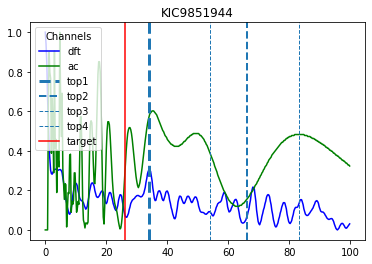

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

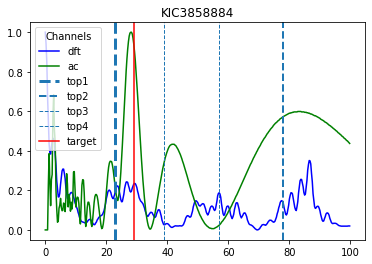

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

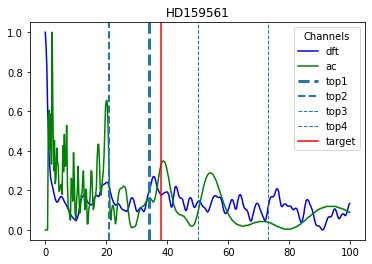

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


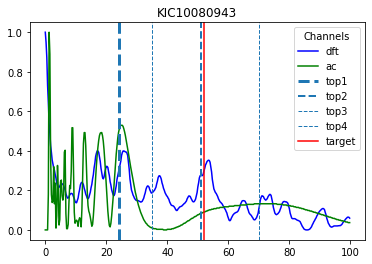

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

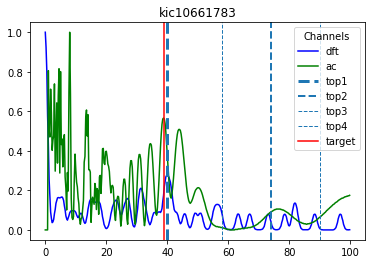

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

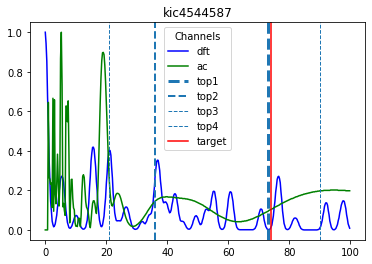

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


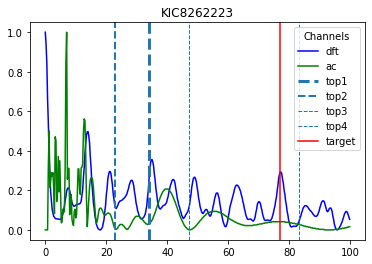

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

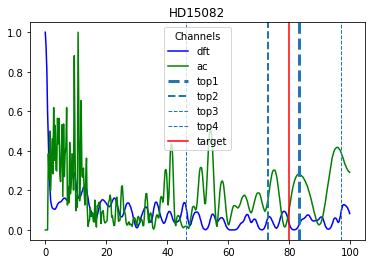

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


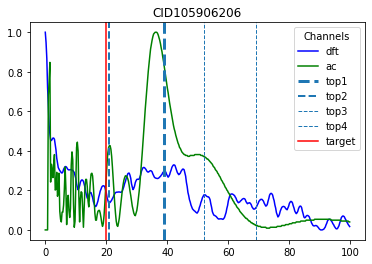

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


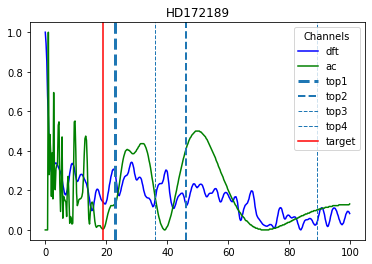

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

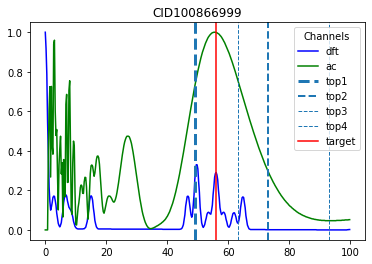

In [19]:
dnu_sun = 134.8

# Save results and predictions
results = {}
for star in df_start.take(11):  # take the 11 ds stars
    target = np.where(star[2].numpy().flat == 1)[0].flat[0]
    # Save results
    if star[0].numpy()[0].decode("utf-8") not in results:
        results[star[0].numpy()[0].decode("utf-8")] = {
            "dnu-target": target,
        }

    # Calculate gradient explainers and shap values
    shap_values, indexes = e.shap_values(
        star[1].numpy(), nsamples=100, ranked_outputs=4
    )

    
    probs = sepconv_mod.predict_proba(star[1])[0]
    peaks, _ = find_peaks(probs, height=0, distance=10)
    peaks_width = peak_widths(probs, peaks)
    peaks_sorted_by_prob = np.sort(probs[peaks])[::-1]


    # save top-k
    best_peak, best_peak_width = get_peak_width(
        0, peaks, peaks_width, peaks_sorted_by_prob
    )
    results[star[0].numpy()[0].decode("utf-8")]["top1"] = best_peak
    # Get error
    results[star[0].numpy()[0].decode("utf-8")]["e-top1"] = best_peak_width
 
    # save top-k
    best_peak, best_peak_width = get_peak_width(
        1, peaks, peaks_width, peaks_sorted_by_prob
    )
    results[star[0].numpy()[0].decode("utf-8")]["top2"] = best_peak
    # Get error
    results[star[0].numpy()[0].decode("utf-8")]["e-top2"] = best_peak_width

    # save top-k
    best_peak, best_peak_width = get_peak_width(
        2, peaks, peaks_width, peaks_sorted_by_prob
    )
    results[star[0].numpy()[0].decode("utf-8")]["top3"] = best_peak
    # Get error
    results[star[0].numpy()[0].decode("utf-8")]["e-top3"] = best_peak_width

    # save top-k
    best_peak, best_peak_width = get_peak_width(
        3, peaks, peaks_width, peaks_sorted_by_prob
    )
    results[star[0].numpy()[0].decode("utf-8")]["top4"] = best_peak
    # Get error
    results[star[0].numpy()[0].decode("utf-8")]["e-top4"] = best_peak_width

    # Get L from Teff,Dnu model
    L = csv_ds[csv_ds.ID.eq(star[0].numpy()[0].decode("utf-8").upper())]["L"].values
    Teff = csv_ds[csv_ds.ID.eq(star[0].numpy()[0].decode("utf-8").upper())][
        "Teff"
    ].values
    if len(L) > 0 and not np.isnan(L) and not np.isnan(Teff):
        l_teff_topk1 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top1"], Teff]
            ).reshape(1, 2)
        )[0]

        l_teff_topk2 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top2"], Teff]
            ).reshape(1, 2)
        )[0]
        l_teff_topk3 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top3"], Teff]
            ).reshape(1, 2)
        )[0]

        # Get L errors
        ls_teff_topks = [l_teff_topk1, l_teff_topk2, l_teff_topk3]
        # Get L errors
        errors = [
            round(np.power(l_teff_topk1 - L[0], 2), 2),
            round(np.power(l_teff_topk2 - L[0], 2), 2),
            round(np.power(l_teff_topk3 - L[0], 2), 2),
        ]
        i = np.argmin(errors)  # Get min error position
        L = ls_teff_topks[i]  # Get most probable L from the model

        P = get_P(np.log10(L))
        p_e = p_error(log_L=np.log10(L))
        rho_q_up = get_rho_from_P(P - p_e, Q=0.042)
        rho_q_down = get_rho_from_P(P + p_e, Q=0.033)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up-fromstarmodel"] = (
            get_dnu_from_rho(rho_q_up) * dnu_sun
        )
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-down-fromstarmodel"] = (
            get_dnu_from_rho(rho_q_down) * dnu_sun
        )
    else:
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-up-fromstarmodel"
        ] = np.nan
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-down-fromstarmodel"
        ] = np.nan

    # Get P from L
    # Check for non L in csv or NaN value
    L = csv_ds[csv_ds.ID.eq(star[0].numpy()[0].decode("utf-8").upper())]["L"].values
    if len(L) > 0 and not np.isnan(L):
        P = get_P(np.log10(L))
        p_e = p_error(log_L=np.log10(L))
        rho_q_up = get_rho_from_P(P - p_e, Q=0.042)
        rho_q_down = get_rho_from_P(P + p_e, Q=0.033)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up"] = (
            get_dnu_from_rho(rho_q_up[0]) * dnu_sun
        )
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-down"] = (
            get_dnu_from_rho(rho_q_down[0]) * dnu_sun
        )
    else:
        print(star[0].numpy()[0].decode("utf-8"))
        print(L)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up"] = np.nan
        results[star[0].numpy()[0].decode("utf-8")]["v-from-P-down"] = np.nan

    if True:
        x = np.arange(0, 100, 0.25)  # x axis from 0 to 100
        plt.plot(x, star[1][0, :, 0], label="dft", color="blue")
        # plt.plot(x, star[1][0, :, 1], label="hod", color="orange", alpha=0.5)
        plt.plot(x, star[1][0, :, 1], label="ac", color="green")
        plt.axvline(
            x=results[star[0].numpy()[0].decode("utf-8")]["top1"],
            label="top1",
            linestyle="dashed",
            linewidth=3,
        )
        plt.axvline(
            x=results[star[0].numpy()[0].decode("utf-8")]["top2"],
            label="top2",
            linestyle="dashed",
            linewidth=2,
        )
        plt.axvline(
            x=results[star[0].numpy()[0].decode("utf-8")]["top3"],
            label="top3",
            linestyle="dashed",
            linewidth=1,
        )
        plt.axvline(
            x=results[star[0].numpy()[0].decode("utf-8")]["top4"],
            label="top4",
            linestyle="dashed",
            linewidth=1,
        )
        plt.axvline(x=target, label="target", color="red")
        plt.title(star[0].numpy()[0].decode("utf-8"))
        plt.legend(title="Channels")
        plt.show()

In [20]:
df = pd.DataFrame(
    columns=[
        "id",
        "dnu-target",
        "top1",
        "e-top1",
        "top2",
        "e-top2",
        "top3",
        "e-top3",
        "top4",
        "e-top4",
        "dnu-from-P-up-fromstarmodel",
        "dnu-from-P-down-fromstarmodel",
        "dnu-from-P-up",
        "dnu-from-P-down"

    ]
)
for i, id in enumerate(results):
    df.loc[i] = [
        id,
        results[id]["dnu-target"],
        results[id]["top1"],
        results[id]["e-top1"],
        results[id]["top2"],
        results[id]["e-top2"],
        results[id]["top3"],
        results[id]["e-top3"],
        results[id]["top4"],
        results[id]["e-top4"],
        results[id]["dnu-from-P-up-fromstarmodel"],
        results[id]["dnu-from-P-down-fromstarmodel"],
        results[id]["dnu-from-P-up"],
        results[id]["dnu-from-P-down"]
    ]
    
# Derive rho from Dnu
df["rho-target"] = get_rho(df["dnu-target"] / dnu_sun)
df["e-rho-target"] = rho_error(np.float64(df["dnu-target"].values / dnu_sun))
df["rho-top1"] = get_rho(df["top1"] / dnu_sun )
df["e-rho-top1"] = rho_error(np.float64(df["top1"].values / dnu_sun))
df["rho-top2"] = get_rho(df["top2"] / dnu_sun )
df["e-rho-top2"] = rho_error(np.float64(df["top2"].values / dnu_sun))
df["rho-top3"] = get_rho(df["top3"] / dnu_sun )
df["e-rho-top3"] = rho_error(np.float64(df["top3"].values / dnu_sun))
df["rho-top4"] = get_rho(df["top4"] / dnu_sun )
df["e-rho-top4"] = rho_error(np.float64(df["top4"].values / dnu_sun))

df

,id,dnu-target,top1,e-top1,top2,e-top2,top3,e-top3,top4,e-top4,...,rho-target,e-rho-target,rho-top1,e-rho-top1,rho-top2,e-rho-top2,rho-top3,e-rho-top3,rho-top4,e-rho-top4
0,KIC9851944,26,34,2.605530,66,1.189474,83,1.003733,54,1.387807,...,0.057596,0.018463,0.0990225,0.031506,0.378116,0.118742,0.600737,0.188156,0.252105,0.079417
1,KIC3858884,29,23,3.613644,78,2.693781,57,1.409748,39,1.314869,...,0.0718109,0.022947,0.0449611,0.014468,0.52988,0.166065,0.281199,0.088501,0.130646,0.041429
2,HD159561,38,34,2.024747,21,1.064188,50,1.013231,73,1.730440,...,0.123968,0.039335,0.0990225,0.031506,0.0374136,0.012076,0.215807,0.068077,0.463509,0.145372
3,KIC10080943,52,24,2.963901,51,1.824679,35,0.926366,70,1.046125,...,0.2336,0.073637,0.0489974,0.015746,0.224615,0.070830,0.104994,0.033382,0.425838,0.133625
4,kic10661783,39,40,1.297765,74,2.518126,90,1.087349,58,1.154284,...,0.130646,0.041429,0.137502,0.043577,0.476425,0.149399,0.707483,0.221437,0.291253,0.091640
5,kic4544587,74,73,1.929718,36,1.490254,90,1.030482,21,1.116072,...,0.476425,0.149399,0.463509,0.145372,0.111142,0.035312,0.707483,0.221437,0.0374136,0.012076
6,KIC8262223,77,34,1.161095,23,0.757434,83,1.005299,47,1.311323,...,0.516247,0.161815,0.0990225,0.031506,0.0449611,0.014468,0.600737,0.188156,0.190451,0.060151
7,HD15082,80,83,1.011470,73,1.015208,97,0.954947,46,1.144795,...,0.557684,0.174734,0.600737,0.188156,0.463509,0.145372,0.823048,0.257471,0.182355,0.057618
8,CID105906206,20,39,1.229034,21,1.178451,69,2.962202,52,1.141167,...,0.0339021,0.010961,0.130646,0.041429,0.0374136,0.012076,0.413639,0.129821,0.2336,0.073637
9,HD172189,19,23,1.634795,46,1.377856,36,1.718467,89,1.336333,...,0.0305653,0.009899,0.0449611,0.014468,0.182355,0.057618,0.111142,0.035312,0.691694,0.216514


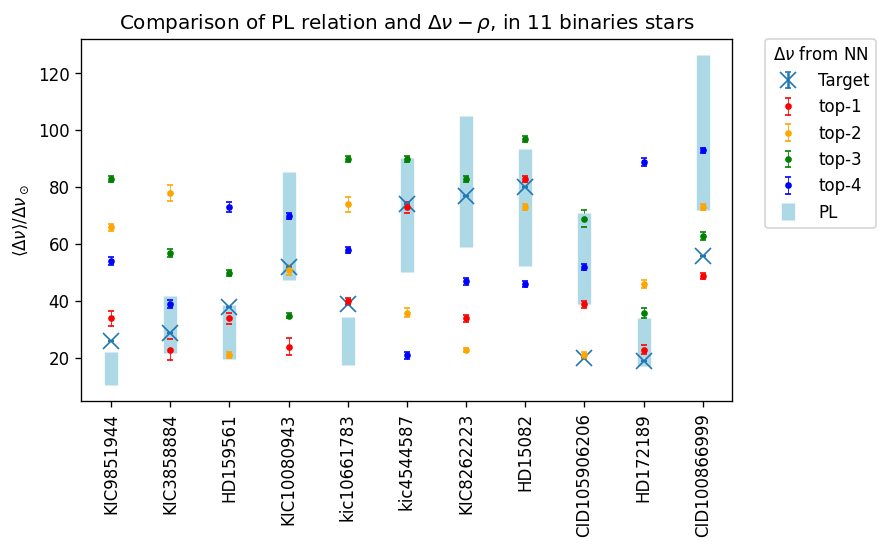

In [21]:
plt.subplots(1, figsize=(7, 4), dpi=120)

plt.errorbar(
    df["id"],
    df["dnu-target"],
    0,
    fmt="x",
    markersize=10,
    capsize=2,
    label="Target"
)

plt.errorbar(
    df["id"],
    df["top1"],
    df["e-top1"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="red",
    label="top-1",
)
plt.errorbar(
    df["id"],
    df["top2"],
    df["e-top2"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="top-2",
)
plt.errorbar(
    df["id"],
    df["top3"],
    df["e-top3"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="top-3",
)
plt.errorbar(
    df["id"],
    df["top4"],
    df["e-top4"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="blue",
    label="top-4",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2,
    df["dnu-from-P-up-fromstarmodel"] - ((df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=10,
    label="PL-From Teff",
    color="blue",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2,
    df["dnu-from-P-up"] - ((df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=0,
    label="PL",
    color="lightblue",
)

plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    title=r"$\Delta\nu$ from NN",
)
#plt.gca().add_artist(legend1)
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$")
plt.title("Comparison of PL relation and $\Delta\\nu-\\rho$, in 11 binaries stars")
#plt.ylim(0, 1.0)
plt.show()

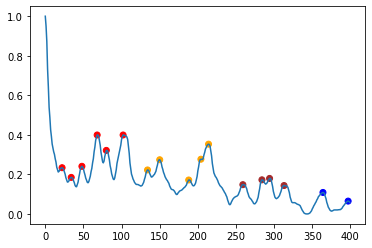

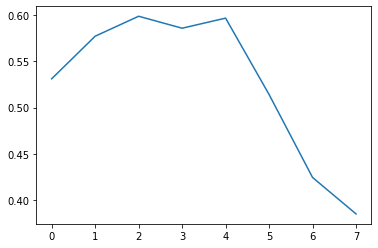

24.000000 - 51.000000
star id: tf.Tensor([b'KIC10080943'], shape=(1,), dtype=string)
Target 52 t1 24 t2 51 flag False


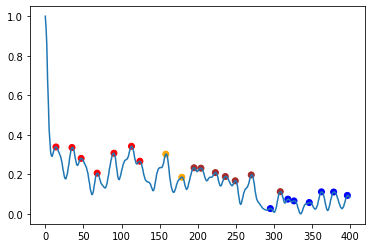

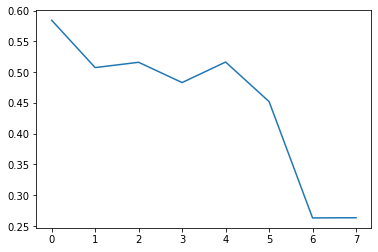

23.000000 - 46.000000
star id: tf.Tensor([b'HD172189'], shape=(1,), dtype=string)
Target 19 t1 23 t2 46 flag True


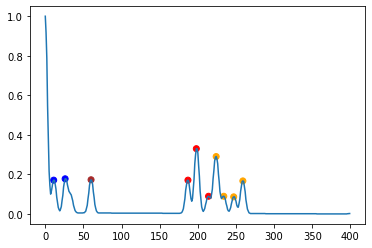

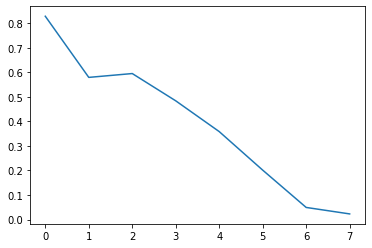

49.000000 - 73.000000
star id: tf.Tensor([b'CID100866999'], shape=(1,), dtype=string)
Target 56 t1 49 t2 73 flag True


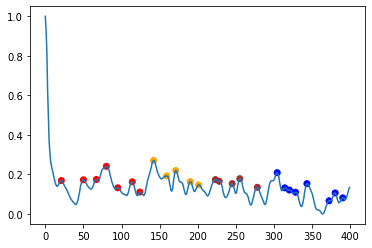

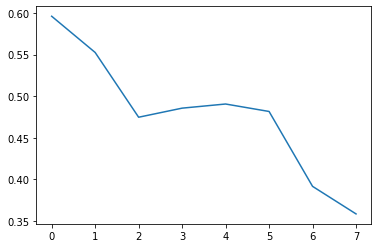

34.000000 - 21.000000
star id: tf.Tensor([b'HD159561'], shape=(1,), dtype=string)
Target 38 t1 34 t2 21 flag True


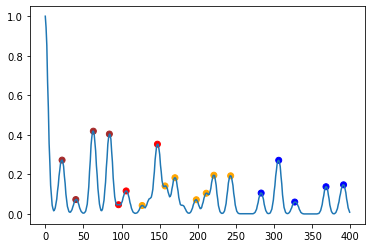

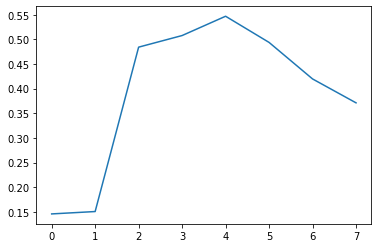

73.000000 - 36.000000
star id: tf.Tensor([b'kic4544587'], shape=(1,), dtype=string)
Target 74 t1 73 t2 36 flag True


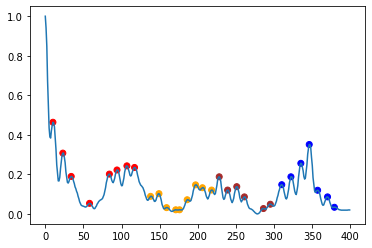

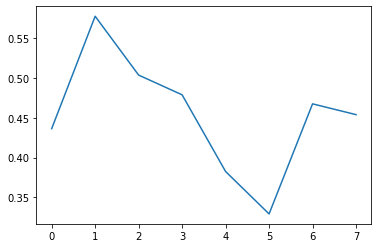

23.000000 - 78.000000
star id: tf.Tensor([b'KIC3858884'], shape=(1,), dtype=string)
Target 29 t1 23 t2 78 flag True


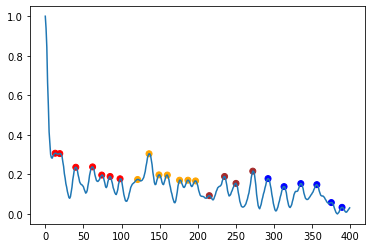

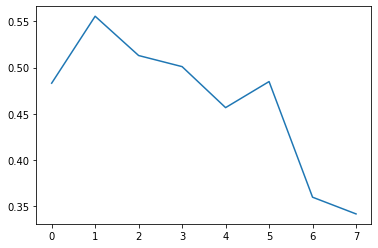

34.000000 - 66.000000
star id: tf.Tensor([b'KIC9851944'], shape=(1,), dtype=string)
Target 26 t1 34 t2 66 flag True


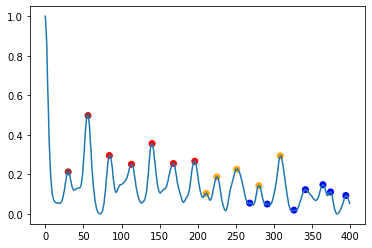

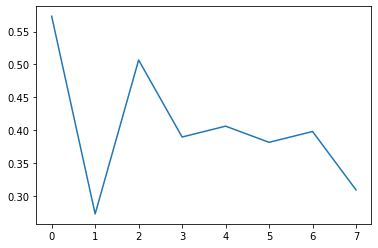

34.000000 - 23.000000
star id: tf.Tensor([b'KIC8262223'], shape=(1,), dtype=string)
Target 77 t1 34 t2 23 flag True


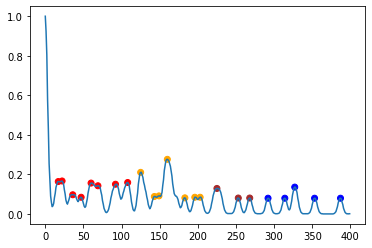

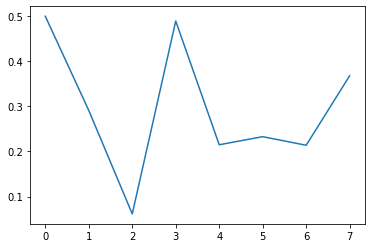

40.000000 - 74.000000
star id: tf.Tensor([b'kic10661783'], shape=(1,), dtype=string)
Target 39 t1 40 t2 74 flag True


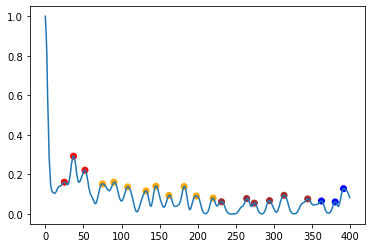

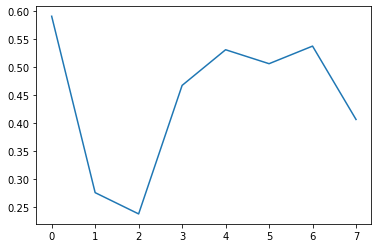

83.000000 - 73.000000
star id: tf.Tensor([b'HD15082'], shape=(1,), dtype=string)
Target 80 t1 83 t2 73 flag True


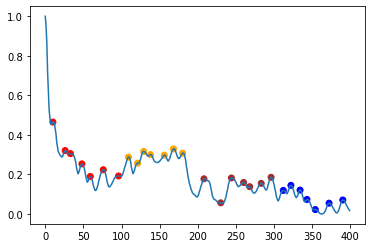

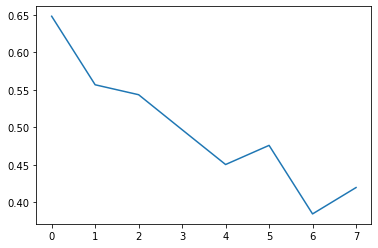

39.000000 - 21.000000
star id: tf.Tensor([b'CID105906206'], shape=(1,), dtype=string)
Target 20 t1 39 t2 21 flag False


In [22]:
from sklearn.metrics import silhouette_samples, silhouette_score

# Save results and predictions
gmm_clust_stds = []
gmm_peaks = []
gmm_clust_minmax = []
y_mod = []
is_multiple = []
peaks_clust_top1 = []
peaks_clust_top2 = []
top1_gr_top2 = []
star_ids = []
_silhouette_avg = []
for star in df_start.take(11):  # take the 11 ds stars
    target = np.where(star[2].numpy().flat == 1)[0].flat[0]

    # Get vector corresponding to DFT
    aux = star[1][0, :, 0].numpy()
    
    # Get all peaks
    peaks, peaks_pos = find_peaks(aux, height=0.0, distance=5)
    peaks_width = peak_widths(aux, peaks)
    peaks_sorted_by_prob = np.sort(aux[peaks])[::-1]

    # Adjust mixture of gaussians on peaks and hegight
    peaks_clust = np.vstack((peaks, peaks_pos["peak_heights"])).T
    # Fit model
    gmmModel = GaussianMixture(n_components=4, covariance_type="full", random_state=123).fit(
        peaks_clust
    )
    # Plot
    colors = ["red", "green", "blue", "purple", "orange", "brown"]
    plt.scatter(
        peaks,
        peaks_pos["peak_heights"],
        c=gmmModel.predict(peaks_clust),
        cmap=matplotlib.colors.ListedColormap(colors),
    )
    plt.plot(aux)
    plt.show()

    si_coef = []
    n_components = np.arange(2, 10)
    for n_c in n_components:

        model = GaussianMixture(n_c, covariance_type='full', random_state=0).fit(peaks_clust)
        cluster_labels = model.predict(peaks_clust)
        silhouette_avg = silhouette_score(peaks_clust, cluster_labels)
        si_coef.append(silhouette_avg)
        #print("For n_clusters =", n_c, "The average silhouette_score is :", silhouette_avg)
    plt.plot(si_coef)
    plt.show()

    # Get star info to create a y_label   
    _star_id = star[0].numpy()[0].decode("utf-8")
    _top1 = df[df["id"]==_star_id]["top1"].values[0]
    _target = df[df["id"]==_star_id]["dnu-target"].values[0]


    
    # Check if top-1 and top-2 is a multiple
    t1 = df[df["id"]==_star_id]["top1"].values[0]
    t2 = df[df["id"]==_star_id]["top2"].values[0]
    print("%f - %f" % (t1, t2))
    mult = -1
    if t1 > t2:
        mult = t1 % t2
    else:
        mult = t2 % t1
    is_multiple.append(mult < 5)
    
    if np.abs(_target - t1) < np.abs(_target - t2):
        y_mod.append(True)
    else:
        y_mod.append(False)

    print("star id: %s" % star[0])
    print("Target",_target,"t1",t1,"t2",t2,"flag",np.abs(_target - t1) < np.abs(_target - t2))

    # Add std of covariances
    gmm_clust_stds.append(np.std(gmmModel.covariances_))
    gmm_peaks.append(peaks.shape[0])
    gb = pd.DataFrame({"peaks":peaks, "clust":gmmModel.predict(peaks_clust)}).groupby(['clust'])
    gmm_clust_minmax.append(np.mean(np.abs(gb.agg([np.min]).values - gb.agg([np.max]).values)[0]))

    gb_agg = gb.agg(np.sum)
    t1_clust = gmmModel.predict(np.asarray([t1,1]).reshape(-1, 2))
    t2_clust =gmmModel.predict(np.asarray([t2,1]).reshape(-1, 2))
    peaks_clust_top1.append(gb_agg.iloc[t1_clust].values[0][0])
    peaks_clust_top2.append(gb_agg.iloc[t2_clust].values[0][0])
    top1_gr_top2.append(t1 > t2)

    star_ids.append(_star_id)

    _silhouette_avg.append(np.argmax(np.diff(si_coef)))

    print("=================================================")

In [23]:
gmm_clust_data = pd.DataFrame({
                                "clust_cov_stds":gmm_clust_stds, 
                                "peaks_number":gmm_peaks, 
                                "std_min_max_clust":gmm_clust_minmax, 
                                "has_mult": is_multiple,
                                "peaks_clust_top1": peaks_clust_top1,
                                "peaks_clust_top2": peaks_clust_top2,
                                "top1_gr_top2": top1_gr_top2,
                                "star_ids": star_ids,
                                "y_mod": y_mod,
                                "sil": _silhouette_avg
                                })

gmm_clust_data

,clust_cov_stds,peaks_number,std_min_max_clust,has_mult,peaks_clust_top1,peaks_clust_top2,top1_gr_top2,star_ids,y_mod,sil
0,290.242109,17,80.0,True,890,890,False,KIC10080943,False,0
1,507.525698,23,110.0,True,491,491,False,HD172189,True,3
2,58.858027,10,27.0,False,599,599,False,CID100866999,True,1
3,363.381708,25,103.0,False,2751,2751,True,HD159561,True,2
4,613.308677,19,51.0,True,209,209,True,kic4544587,True,1
5,478.071915,30,107.0,False,527,527,False,KIC3858884,True,0
6,412.501297,24,85.0,False,1126,1126,False,KIC9851944,True,0
7,619.507255,19,112.0,False,701,701,True,KIC8262223,True,1
8,390.759277,23,91.0,False,1159,1159,False,kic10661783,True,2
9,764.092344,21,27.0,False,114,114,True,HD15082,True,2


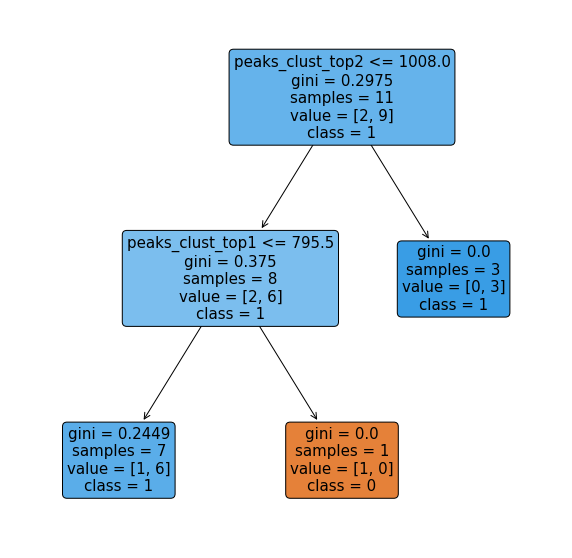

In [24]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

selected_vars_gmm = ["peaks_clust_top1", "peaks_clust_top2"]

clf = DecisionTreeClassifier(random_state=0, max_depth=2)
clf.fit(gmm_clust_data[selected_vars_gmm], gmm_clust_data[["y_mod"]])
plt.figure(figsize=(10, 10))
dec_tree = plot_tree(
    decision_tree=clf,
    feature_names=selected_vars_gmm,
    class_names=["0", "1"],
    filled=True,
    precision=4,
    rounded=True,
)

In [25]:
confusion_matrix(y_mod, clf.predict(gmm_clust_data[selected_vars_gmm]))

array([[1, 1],
       [0, 9]])

In [26]:
print(classification_report(y_mod, clf.predict(gmm_clust_data[selected_vars_gmm])))

              precision    recall  f1-score   support

       False       1.00      0.50      0.67         2
        True       0.90      1.00      0.95         9

    accuracy                           0.91        11
   macro avg       0.95      0.75      0.81        11
weighted avg       0.92      0.91      0.90        11



KIC9851944
KIC3858884
HD159561
KIC10080943
kic10661783
kic4544587
KIC8262223
HD15082
CID105906206
HD172189
CID100866999


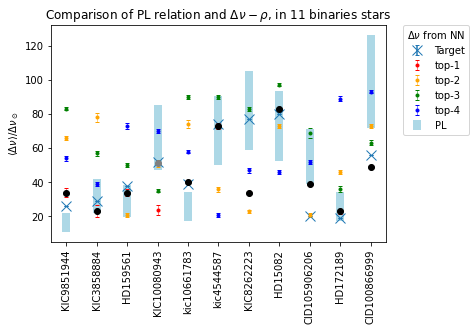

In [27]:
# Prepare data plot
targets = []
inferences = []
inferences_top2 = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])
    inferences_top2.append(results[tess_id]["top2"])


for i, txt in enumerate(ids):
    print(txt)
    # get prediction
    flag = clf.predict(gmm_clust_data[gmm_clust_data["star_ids"]==ids[i]][selected_vars_gmm])
    if flag:
        plt.scatter(ids[i], inferences[i], color="black", zorder=1000)
    else:
        plt.scatter(ids[i], inferences_top2[i], color="grey", zorder=1000)
        
plt.errorbar(
    df["id"],
    df["dnu-target"],
    0,
    fmt="x",
    markersize=10,
    capsize=2,
    label="Target"
)

plt.errorbar(
    df["id"],
    df["top1"],
    df["e-top1"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="red",
    label="top-1",
)
plt.errorbar(
    df["id"],
    df["top2"],
    df["e-top2"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="top-2",
)
plt.errorbar(
    df["id"],
    df["top3"],
    df["e-top3"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="top-3",
)
plt.errorbar(
    df["id"],
    df["top4"],
    df["e-top4"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="blue",
    label="top-4",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2,
    df["dnu-from-P-up-fromstarmodel"] - ((df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=10,
    label="PL-From Teff",
    color="blue",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2,
    df["dnu-from-P-up"] - ((df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=0,
    label="PL",
    color="lightblue",
)

plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    title=r"$\Delta\nu$ from NN",
)
#plt.gca().add_artist(legend1)
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$")
plt.title("Comparison of PL relation and $\Delta\\nu-\\rho$, in 11 binaries stars")
#plt.ylim(0, 1.0)
plt.show()

In [28]:
df

,id,dnu-target,top1,e-top1,top2,e-top2,top3,e-top3,top4,e-top4,...,rho-target,e-rho-target,rho-top1,e-rho-top1,rho-top2,e-rho-top2,rho-top3,e-rho-top3,rho-top4,e-rho-top4
0,KIC9851944,26,34,2.605530,66,1.189474,83,1.003733,54,1.387807,...,0.057596,0.018463,0.0990225,0.031506,0.378116,0.118742,0.600737,0.188156,0.252105,0.079417
1,KIC3858884,29,23,3.613644,78,2.693781,57,1.409748,39,1.314869,...,0.0718109,0.022947,0.0449611,0.014468,0.52988,0.166065,0.281199,0.088501,0.130646,0.041429
2,HD159561,38,34,2.024747,21,1.064188,50,1.013231,73,1.730440,...,0.123968,0.039335,0.0990225,0.031506,0.0374136,0.012076,0.215807,0.068077,0.463509,0.145372
3,KIC10080943,52,24,2.963901,51,1.824679,35,0.926366,70,1.046125,...,0.2336,0.073637,0.0489974,0.015746,0.224615,0.070830,0.104994,0.033382,0.425838,0.133625
4,kic10661783,39,40,1.297765,74,2.518126,90,1.087349,58,1.154284,...,0.130646,0.041429,0.137502,0.043577,0.476425,0.149399,0.707483,0.221437,0.291253,0.091640
5,kic4544587,74,73,1.929718,36,1.490254,90,1.030482,21,1.116072,...,0.476425,0.149399,0.463509,0.145372,0.111142,0.035312,0.707483,0.221437,0.0374136,0.012076
6,KIC8262223,77,34,1.161095,23,0.757434,83,1.005299,47,1.311323,...,0.516247,0.161815,0.0990225,0.031506,0.0449611,0.014468,0.600737,0.188156,0.190451,0.060151
7,HD15082,80,83,1.011470,73,1.015208,97,0.954947,46,1.144795,...,0.557684,0.174734,0.600737,0.188156,0.463509,0.145372,0.823048,0.257471,0.182355,0.057618
8,CID105906206,20,39,1.229034,21,1.178451,69,2.962202,52,1.141167,...,0.0339021,0.010961,0.130646,0.041429,0.0374136,0.012076,0.413639,0.129821,0.2336,0.073637
9,HD172189,19,23,1.634795,46,1.377856,36,1.718467,89,1.336333,...,0.0305653,0.009899,0.0449611,0.014468,0.182355,0.057618,0.111142,0.035312,0.691694,0.216514


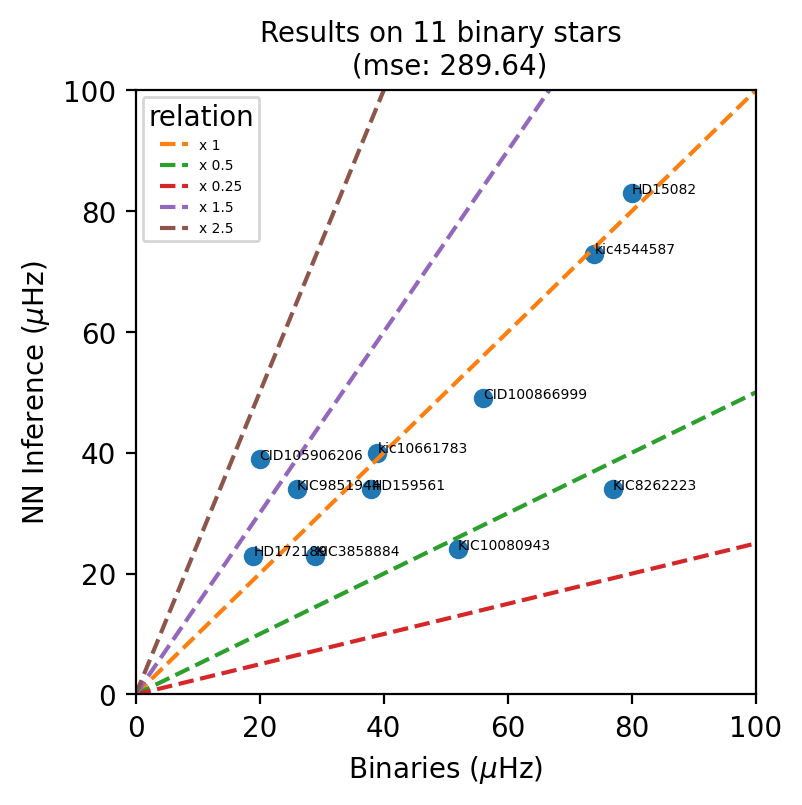

In [29]:
# Prepare data plot
targets = []
inferences = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])
    
# Set lims
plt.subplots(1, figsize=(4, 4), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
abline(1.5, 0)
abline(2.5, 0)
plt.legend(title="relation", fontsize=5)
plt.xlabel("Binaries ($\mu$Hz)")
plt.ylabel("NN Inference ($\mu$Hz)")
plt.title("Results on 11 binary stars \n (mse: %s)" % np.round(np.mean(np.power(np.asarray(targets)-np.asarray(inferences), 2)), 2), fontsize=10)
plt.show()
plt.show()

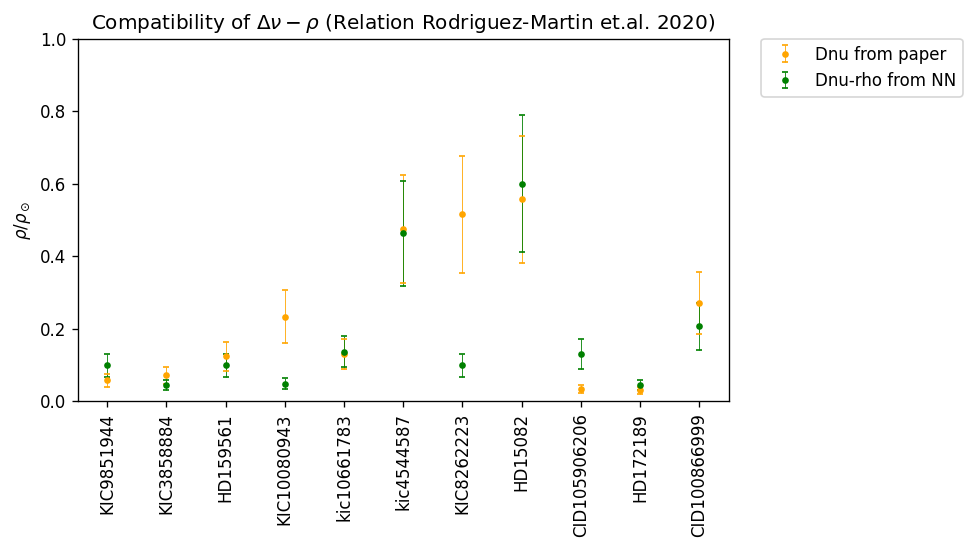

In [30]:
plt.subplots(1, figsize=(7, 4), dpi=120)

plt.errorbar(
    ids,
    get_rho(np.asarray(targets) / dnu_sun),
    rho_error(np.float64(np.asarray(targets) / dnu_sun)),
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="Dnu from paper"
)

plt.errorbar(
    ids,
    get_rho(np.asarray(inferences) / dnu_sun),
    rho_error(np.float64(np.asarray(inferences) / dnu_sun)),
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="Dnu-rho from NN"
)

plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0)
#plt.gca().add_artist(legend1)

plt.ylabel("$\\rho / \\rho_\\odot$")
plt.title("Compatibility of $\Delta\\nu-\\rho$ (Relation Rodriguez-Martin et.al. 2020)")
plt.ylim(0, 1.0)
plt.show()

In [31]:
results_binaries = pd.DataFrame(
    columns=[
        "id",
        "dnu-target",
        "e-dnu-target",
        "dnu-from-P",
        "e-dnu-from-P",
        "best-top",
        "e-best-top",
        "ktop",
    ]
)

for index, row in df.iterrows():
    print("Proccessing star %s" % row["id"])
    print("PL[%f,%f]" % (row["dnu-from-P-up"], row["dnu-from-P-down"]))
    # Top index to search on 
    top_indexs = ["top1", "top2", "top3"]
    best = np.nan # empty on start
    # Center of PL window
    central_pl_window = row["dnu-from-P-up"]-((row["dnu-from-P-up"]-row["dnu-from-P-down"])/2)
    # Check predictions indise L window
    inside_pl_window = []
    for top_index in top_indexs:
        flag_full_inside = (row[top_index] + row["e-%s" % (top_index)] <= row["dnu-from-P-up"]) & (row[top_index] - row["e-%s" % (top_index)] >= row["dnu-from-P-down"])
        flag_partial =  ((row[top_index] - row["e-%s" % (top_index)] >= row["dnu-from-P-down"]) & (row[top_index] - row["e-%s" % (top_index)] <= row["dnu-from-P-up"])) | ((row[top_index] + row["e-%s" % (top_index)] >= row["dnu-from-P-down"]) & (row[top_index] + row["e-%s" % (top_index)] <= row["dnu-from-P-up"])) 
        if flag_full_inside or flag_partial:
            inside_pl_window.append(top_index)
    print("   =>Inside PL window: %s" % inside_pl_window)

    if (len(inside_pl_window) > 0) and (not np.isnan(row["dnu-from-P-up"])):
        print("=>",inside_pl_window)
        top_index = inside_pl_window[0] # Get most probable from NN
        
        # Get best
        best = row["%s" % (top_index)]
        results_binaries.loc[len(results_binaries)] = [
                        row["id"],
                        row["dnu-target"],
                        0.23,
                        (row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2,
                        row["dnu-from-P-up"] - ((row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2),
                        best,
                        row["e-%s" % top_index],
                        top_index
                    ]
    else:
        # Get closest inference to the center of PL window
        top_index = np.argmin([np.abs(row[top_index]-central_pl_window) for top_index in top_indexs])
        # Check if predictions is not inside window
        # Get best
        best = row["top%s" % (top_index+1)]
        results_binaries.loc[len(results_binaries)] = [
                        row["id"],
                        row["dnu-target"],
                        0.23,
                        (row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2,
                        row["dnu-from-P-up"] - ((row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2),
                        best,
                        row["e-top%s" % (top_index+1)],
                        top_index
                    ]

Proccessing star KIC9851944
PL[22.013591,10.647775]
   =>Inside PL window: []
Proccessing star KIC3858884
PL[41.985046,21.843379]
   =>Inside PL window: ['top1']
=> ['top1']
Proccessing star HD159561
PL[38.537790,19.870672]
   =>Inside PL window: ['top1', 'top2']
=> ['top1', 'top2']
Proccessing star KIC10080943
PL[85.316430,47.322315]
   =>Inside PL window: ['top2']
=> ['top2']
Proccessing star kic10661783
PL[34.545158,17.603175]
   =>Inside PL window: []
Proccessing star kic4544587
PL[90.413084,50.365296]
   =>Inside PL window: ['top1', 'top3']
=> ['top1', 'top3']
Proccessing star KIC8262223
PL[104.970838,59.080258]
   =>Inside PL window: ['top3']
=> ['top3']
Proccessing star HD15082
PL[93.569327,52.252186]
   =>Inside PL window: ['top1', 'top2']
=> ['top1', 'top2']
Proccessing star CID105906206
PL[71.165271,38.907339]
   =>Inside PL window: ['top1', 'top3']
=> ['top1', 'top3']
Proccessing star HD172189
PL[34.079468,17.340043]
   =>Inside PL window: ['top1']
=> ['top1']
Proccessing st

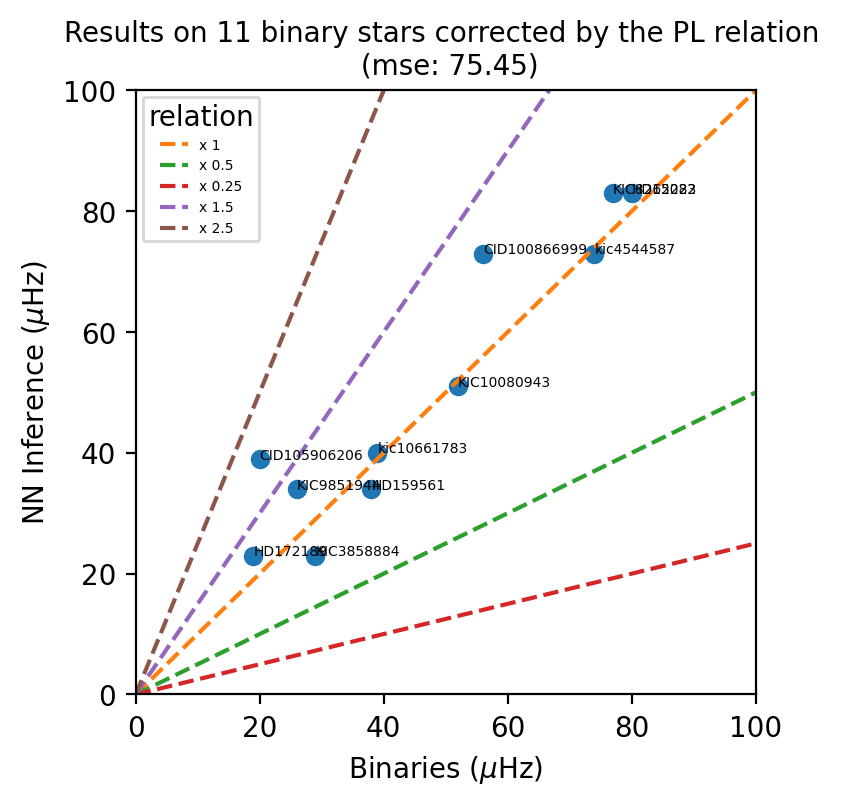

In [32]:
# Prepare data plot
targets = results_binaries["dnu-target"]
inferences = results_binaries["best-top"]
ids = results_binaries["id"]

# Set lims
plt.subplots(1, figsize=(4, 4), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
abline(1.5, 0)
abline(2.5, 0)
plt.legend(title="relation", fontsize=5)
plt.xlabel("Binaries ($\mu$Hz)")
plt.ylabel("NN Inference ($\mu$Hz)")
plt.title("Results on 11 binary stars corrected by the PL relation \n (mse: %s)" % np.round(np.mean(np.power(np.asarray(targets)-np.asarray(inferences), 2)), 2), fontsize=10)
plt.show()

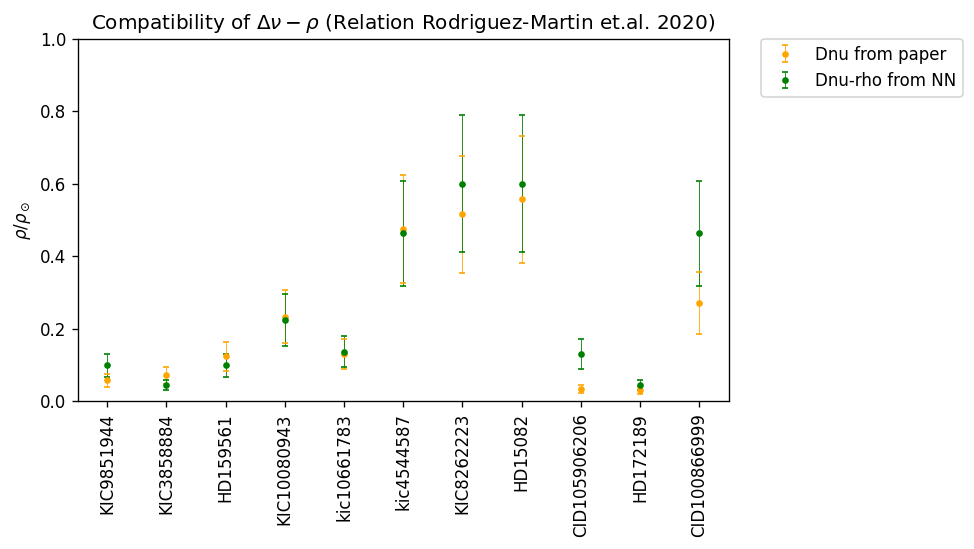

In [33]:
plt.subplots(1, figsize=(7, 4), dpi=120)

plt.errorbar(
    ids,
    get_rho(targets / dnu_sun),
    rho_error(np.float64(targets / dnu_sun)),
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="Dnu from paper"
)

plt.errorbar(
    ids,
    get_rho(inferences / dnu_sun),
    rho_error(np.float64(inferences / dnu_sun)),
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="Dnu-rho from NN"
)

plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0)
#plt.gca().add_artist(legend1)

plt.ylabel("$\\rho / \\rho_\\odot$")
plt.title("Compatibility of $\Delta\\nu-\\rho$ (Relation Rodriguez-Martin et.al. 2020)")
plt.ylim(0, 1)
plt.show()

## Read and process Bedding stars 

In [34]:
"""
df_att = pd.io.parsers.read_csv("../data/bedding/bedding.csv", sep=",", index_col=0)
rows = []
for i,row in pd.io.parsers.read_csv("../data/bedding/parameters.csv", sep=",", header=1, names=["star", "L", "Teff", "dnu"]).iterrows():
    print(row)
    L = df_att[df_att.TIC.eq(str(int(row["star"].split("-")[2])))]["L"].values[0]
    Teff = df_att[df_att.TIC.eq(str(int(row["star"].split("-")[2])))]["Teff"].values[0]
    rows.append([row["star"], L, Teff, row["dnu"]])
df_aux = pd.DataFrame(rows, columns = ['star', 'L', "Teff", "dnu"])  
print(df_aux.head(57))
df_aux.to_csv("../data/bedding/parameters.csv", index=False, header=True)
"""

'\ndf_att = pd.io.parsers.read_csv("../data/bedding/bedding.csv", sep=",", index_col=0)\nrows = []\nfor i,row in pd.io.parsers.read_csv("../data/bedding/parameters.csv", sep=",", header=1, names=["star", "L", "Teff", "dnu"]).iterrows():\n    print(row)\n    L = df_att[df_att.TIC.eq(str(int(row["star"].split("-")[2])))]["L"].values[0]\n    Teff = df_att[df_att.TIC.eq(str(int(row["star"].split("-")[2])))]["Teff"].values[0]\n    rows.append([row["star"], L, Teff, row["dnu"]])\ndf_aux = pd.DataFrame(rows, columns = [\'star\', \'L\', "Teff", "dnu"])  \nprint(df_aux.head(57))\ndf_aux.to_csv("../data/bedding/parameters.csv", index=False, header=True)\n'

In [35]:
df_att = pd.io.parsers.read_csv("../data/bedding/bedding.csv", sep=",", index_col=0)
df_att

,HD,Name,TIC,V,Teff,L,e.L.,rho,e.rho.,Dnu,eps,vsini,e.vsini.,F0
1,2280.0,NaN,281499618,9.13,7510.0,5.52,0.26,0.49,0.06,7.17,1.73,26.4,1.3,19.5741
2,3622.0,NaN,43363194,7.77,7930.0,7.86,0.35,0.45,0.06,6.89,1.61,50.0,6.0,17.9829
3,10779.0,NaN,229139161,8.78,7730.0,8.13,0.36,0.39,0.05,6.80,1.63,91.0,5.0,17.8840
4,10961.0,NaN,231014033,9.39,7430.0,NaN,NaN,NaN,NaN,7.30,1.70,33.0,3.0,19.7100
5,17341.0,NaN,122615966,9.32,7810.0,10.05,0.50,0.32,0.05,5.90,1.73,14.0,1.0,16.1070
6,17693.0,NaN,122686610,7.80,7880.0,10.21,0.44,0.33,0.04,6.41,1.61,NaN,NaN,16.7301
7,20203.0,NaN,274038922,8.85,7970.0,8.06,0.38,0.45,0.05,7.20,1.76,40.0,25.0,19.8720
8,20232.0,NaN,159895674,6.88,8060.0,8.64,0.36,0.44,0.05,6.86,1.64,37.0,3.0,18.1104
9,24572.0,NaN,242944780,9.45,7410.0,7.25,0.36,0.35,0.05,7.20,1.58,NaN,NaN,18.5760
10,24975.0,NaN,44645679,7.24,7790.0,9.20,0.39,0.35,0.04,6.23,1.58,88.0,4.0,16.0734


In [36]:
df_att["logg"] = np.nan
df_att["Teff_mast"] = np.nan
df_att["e_logg"] = np.nan
df_att["e_Teff_mast"] = np.nan
df_att["stellar_radius"] = np.nan
df_att["e_stellar_radius"] = np.nan

In [37]:
from astroquery.mast import Observations, Catalogs

for star_name in ["TIC %s" % str(e) for e in df_att[0:57]["TIC"].values]:
    break
    catalogTIC = Catalogs.query_object(
        star_name, radius=0.00033, catalog="TIC", mission="TESS", data_release=1
    )
    print(catalogTIC["Teff", "logg"])
    try:
        df_att.loc[df_att.TIC == star_name.split(" ")[1], ["logg"]] = catalogTIC["logg"]
        df_att.loc[df_att.TIC == star_name.split(" ")[1], ["e_logg"]] = catalogTIC["e_logg"]
        df_att.loc[df_att.TIC == star_name.split(" ")[1], ["Teff_mast"]] = catalogTIC[
            "Teff"
        ]
        df_att.loc[df_att.TIC == star_name.split(" ")[1], ["e_Teff_mast"]] = catalogTIC[
            "e_Teff"
        ]
        df_att.loc[df_att.TIC == star_name.split(" ")[1], ["stellar_radius"]] = catalogTIC["rad"]
        df_att.loc[df_att.TIC == star_name.split(" ")[1], ["e_stellar_radius"]] = catalogTIC["e_rad"]
    except:
        print("Problems in %s" % star_name)

In [38]:
"""
# I add data to the 9147509  star.
df_att.loc[df_att.TIC == "9147509", ["logg"]] = 4.2535
df_att.loc[df_att.TIC == "9147509", ["e_logg"]] = 0.0743759
df_att.loc[df_att.TIC == "9147509", ["Teff_mast"]] = 7886
df_att.loc[df_att.TIC == "9147509", ["e_Teff_mast"]] = 165.597
df_att.loc[df_att.TIC == "9147509", ["stellar_radius"]] = 1.69572
df_att.loc[df_att.TIC == "9147509", ["e_stellar_radius"]] = 0.0493341

    
plt.scatter(df_att["logg"], df_att["Dnu"])
plt.xlabel("logg")
plt.ylabel("Dnu")
plt.show()

plt.scatter(df_att["Teff"], df_att["Teff_mast"])
plt.xlabel("Teff")
plt.ylabel("Teff_mast")
plt.show()

df_att.to_csv("../data/bedding/bedding_teff_logg_rad.csv", index=False, header=True)
"""

'\n# I add data to the 9147509  star.\ndf_att.loc[df_att.TIC == "9147509", ["logg"]] = 4.2535\ndf_att.loc[df_att.TIC == "9147509", ["e_logg"]] = 0.0743759\ndf_att.loc[df_att.TIC == "9147509", ["Teff_mast"]] = 7886\ndf_att.loc[df_att.TIC == "9147509", ["e_Teff_mast"]] = 165.597\ndf_att.loc[df_att.TIC == "9147509", ["stellar_radius"]] = 1.69572\ndf_att.loc[df_att.TIC == "9147509", ["e_stellar_radius"]] = 0.0493341\n\n    \nplt.scatter(df_att["logg"], df_att["Dnu"])\nplt.xlabel("logg")\nplt.ylabel("Dnu")\nplt.show()\n\nplt.scatter(df_att["Teff"], df_att["Teff_mast"])\nplt.xlabel("Teff")\nplt.ylabel("Teff_mast")\nplt.show()\n\ndf_att.to_csv("../data/bedding/bedding_teff_logg_rad.csv", index=False, header=True)\n'

In [39]:
# Save results and predictions
results = {}
for star in df_bedding.take(57):  # take the stars
    target = np.where(star[2].numpy().flat == 1)[0].flat[0] / 0.0864
    # Save results
    if star[0].numpy()[0].decode("utf-8") not in results:
        results[star[0].numpy()[0].decode("utf-8")] = {
            "dnu-target": target,
        }

    # Calculate gradient explainers and shap values
    shap_values, indexes = e.shap_values(star[1].numpy(), nsamples=100, ranked_outputs=4)
    
    probs = sepconv_mod.predict_proba(star[1])[0]
    peaks, _ = find_peaks(probs, height=0, distance=10)
    peaks_width = peak_widths(probs, peaks)
    peaks_sorted_by_prob = np.sort(probs[peaks])[::-1]
    best_peak, best_peak_width = get_peak_width(0, peaks, peaks_width, peaks_sorted_by_prob)

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top1"] = np.where(
        probs == peaks_sorted_by_prob[0]
    )[0][0]
    # Get error
    results[star[0].numpy()[0].decode("utf-8")]["e-top1"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top2"] = np.where(
        probs == peaks_sorted_by_prob[1]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(1, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top2"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top3"] = np.where(
        probs == peaks_sorted_by_prob[2]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(2, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top3"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top4"] = np.where(
        probs == peaks_sorted_by_prob[3]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(3, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top4"] = best_peak_width




    L = df_att[
        df_att.TIC.eq(str(int(star[0].numpy()[0].decode("utf-8").split("-")[2])))
    ]["L"].values
    Teff = df_att[
        df_att.TIC.eq(str(int(star[0].numpy()[0].decode("utf-8").split("-")[2])))
    ]["Teff"].values
    if len(Teff) > 0 and not np.isnan(Teff):

        l_teff_topk1 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top1"], Teff]
            ).reshape(1, 2)
        )[0]
        l_teff_topk2 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top2"], Teff]
            ).reshape(1, 2)
        )[0]
        l_teff_topk3 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top3"], Teff]
            ).reshape(1, 2)
        )[0]

        # Get L errors
        ls_teff_topks = [l_teff_topk1, l_teff_topk2, l_teff_topk3]
        # Get L errors
        errors = [
            round(np.power(l_teff_topk1 - L[0], 2), 2),
            round(np.power(l_teff_topk2 - L[0], 2), 2),
            round(np.power(l_teff_topk3 - L[0], 2), 2)
        ]
        i = np.argmin(errors)  # Get min error position
        L = ls_teff_topks[i]  # Get most probable L from the model

        P = get_P(np.log10(L))
        p_e = p_error(log_L=np.log10(L))
        rho_q_up = get_rho_from_P(P - p_e, Q=0.042)
        rho_q_down = get_rho_from_P(P + p_e, Q=0.033)

        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-up-fromstarmodel"
        ] = get_dnu_from_rho(rho_q_up) * dnu_sun
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-down-fromstarmodel"
        ] = get_dnu_from_rho(rho_q_down) * dnu_sun
    else:
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-up-fromstarmodel"
        ] = np.nan
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-down-fromstarmodel"
        ] = np.nan


    # Get L from Teff,Dnu model
    L = df_att[
        df_att.TIC.eq(str(int(star[0].numpy()[0].decode("utf-8").split("-")[2])))
    ]["L"].values
    if len(L) > 0 and not np.isnan(L):
        P = get_P(np.log10(L))
        p_e = p_error(log_L=np.log10(L))
        rho_q_up = get_rho_from_P(P - p_e, Q=0.042)
        rho_q_down = get_rho_from_P(P + p_e, Q=0.033)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up"] = get_dnu_from_rho(rho_q_up[0]) * dnu_sun
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-down"] = get_dnu_from_rho(rho_q_down[0]) * dnu_sun
    else:
        print(star[0].numpy()[0].decode("utf-8"))
        print(L)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up"] = np.nan
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-down"] = np.nan


    if False:
        x = np.arange(0, 100, 0.25)  # x axis from 0 to 100
        plt.plot(x, star[1][0, :, 0], label="dft", color="blue")
        #plt.plot(x, star[1][0, :, 1], label="hod", color="orange", alpha=0.5)
        plt.plot(x, star[1][0, :, 1], label="ac", color="green")
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top1"], label="top1", linestyle="dashed", linewidth = 3)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top2"], label="top2", linestyle="dashed", linewidth = 2)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top3"], label="top3", linestyle="dashed", linewidth = 1)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top4"], label="top4", linestyle="dashed", linewidth = 1)
        plt.axvline(x=target, label="target", color="red")
        plt.title(star[0].numpy()[0].decode("utf-8"))
        plt.legend(title="Channels")
        plt.show()

H_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
tess2019032160000-s0008-0000000176400189-0136-s_lc_det
[nan]
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERB

In [40]:
df = pd.DataFrame(
    columns=[
        "id",
        "dnu-target",
        "top1",
        "e-top1",
        "top2",
        "e-top2",
        "top3",
        "e-top3",
        "top4",
        "e-top4",
        "dnu-from-P-up-fromstarmodel",
        "dnu-from-P-down-fromstarmodel",
        "dnu-from-P-up",
        "dnu-from-P-down"

    ]
)
for i, id in enumerate(results):
    df.loc[i] = [
        id,
        results[id]["dnu-target"],
        results[id]["top1"],
        results[id]["e-top1"],
        results[id]["top2"],
        results[id]["e-top2"],
        results[id]["top3"],
        results[id]["e-top3"],
        results[id]["top4"],
        results[id]["e-top4"],
        results[id]["dnu-from-P-up-fromstarmodel"],
        results[id]["dnu-from-P-down-fromstarmodel"],
        results[id]["dnu-from-P-up"],
        results[id]["dnu-from-P-down"]
    ]
df

,id,dnu-target,top1,e-top1,top2,e-top2,top3,e-top3,top4,e-top4,dnu-from-P-up-fromstarmodel,dnu-from-P-down-fromstarmodel,dnu-from-P-up,dnu-from-P-down
0,tess2018319095959-s0005-0000000071134596-0125-...,81.018519,42,1.101737,86,1.712817,76,1.244492,65,1.089500,59.884660,32.250885,65.021403,35.274913
1,tess2019169103026-s0013-0000000269792989-0146-...,69.444444,71,1.262247,31,1.067596,54,1.074314,20,1.462074,NaN,NaN,NaN,NaN
2,tess2018319095959-s0005-0000000100531058-0125-...,69.444444,38,1.314322,22,1.048925,77,1.207267,62,2.709723,61.883121,33.425836,66.771055,36.307768
3,tess2018292075959-s0004-0000000274038922-0124-...,81.018519,81,1.032950,37,1.343976,25,1.095920,67,1.278432,67.119157,36.513418,78.528288,43.278586
4,tess2019006130736-s0007-0000000278179191-0131-...,69.444444,38,2.534777,61,1.014434,76,2.832986,21,1.270569,89.824792,50.013793,93.471066,52.193418
5,tess2018319095959-s0005-0000000259675399-0125-...,69.444444,30,4.236293,40,1.163036,61,1.074599,71,1.257952,67.514748,36.747185,77.361676,42.584862
6,tess2019032160000-s0008-0000000176400189-0136-...,69.444444,32,1.466002,71,1.159129,52,1.154854,21,1.109137,NaN,NaN,NaN,NaN
7,tess2019032160000-s0008-0000000332516661-0136-...,57.870370,30,1.599047,67,1.567963,54,1.290611,43,2.647982,82.787839,45.814681,80.266927,44.313175
8,tess2019006130736-s0007-0000000112484997-0131-...,69.444444,36,2.209089,69,1.172194,21,1.186692,95,0.955620,72.031127,39.420439,78.528288,43.278586
9,tess2018263035959-s0003-0000000043363194-0123-...,69.444444,77,1.180074,35,1.051584,56,1.271015,95,1.188352,73.233508,40.133400,79.806657,44.039208


In [41]:
stars_fundamental_mode = ["tess2018263035959-s0003-0000000159895674-0123-s_lc_det",
                          "tess2018319095959-s0005-0000000044645679-0125-s_lc_det",
                          "tess2018319095959-s0005-0000000459942890-0125-s_lc_det",
                          "tess2018319095959-s0005-0000000009147509-0125-s_lc_det",
                          "tess2018319095959-s0005-0000000316920092-0125-s_lc_det",
                          "tess2018292075959-s0004-0000000274038922-0124-s_lc_det",
                          "tess2018349182459-s0006-0000000282265535-0126-s_lc_det",
                          "tess2018349182459-s0006-0000000408906554-0126-s_lc_det",
                          "tess2018319095959-s0005-0000000255548143-0125-s_lc_det",
                          "tess2018349182459-s0006-0000000172193026-0126-s_lc_det",
                          "tess2018349182459-s0006-0000000294157254-0126-s_lc_det",
                          "tess2019058134432-s0009-0000000287347434-0139-s_lc_det",
                          "tess2018349182459-s0006-0000000011361473-0126-s_lc_det",
                          "tess2019058134432-s0009-0000000388351327-0139-s_lc_det",
                          "tess2019032160000-s0008-0000000176400189-0136-s_lc_det",
                          "tess2018263035959-s0003-0000000043363194-0123-s_lc_det",
                          "tess2018234235059-s0002-0000000327996759-0121-s_lc_det",
                          "tess2018234235059-s0002-0000000224284988-0121-s_lc_det",
                          "tess2019032160000-s0008-0000000332516661-0136-s_lc_det"]

In [42]:
# Prepare data plot
targets = []
inferences = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])
    
# Get inferenes "close" to targets and create a True/Flase flag
sign = np.abs(np.asarray(targets) - np.asarray(inferences)) < 10
vals = np.asarray(targets, dtype=float)[sign==True] 

# Get stars in stars_fundamental_mode list mode
list_stars_in_fundamental_model = [(i, i in stars_fundamental_mode) for i in df[sign]["id"].values]
import pprint
print(pprint.pformat(list_stars_in_fundamental_model))

# Get percentage
print("Percentage of stars radial mode in NN inference: %f" % (sum([i in stars_fundamental_mode for i in df[sign]["id"].values]) / len(stars_fundamental_mode)))

[('tess2019169103026-s0013-0000000269792989-0146-s_lc_det', False),
 ('tess2018292075959-s0004-0000000274038922-0124-s_lc_det', True),
 ('tess2018263035959-s0003-0000000043363194-0123-s_lc_det', True),
 ('tess2018319095959-s0005-0000000024344701-0125-s_lc_det', False),
 ('tess2019058134432-s0009-0000000260161111-0139-s_lc_det', False),
 ('tess2018319095959-s0005-0000000255548143-0125-s_lc_det', True),
 ('tess2018263035959-s0003-0000000159895674-0123-s_lc_det', True),
 ('tess2019058134432-s0009-0000000388351327-0139-s_lc_det', True),
 ('tess2018349182459-s0006-0000000282265535-0126-s_lc_det', True),
 ('tess2018349182459-s0006-0000000034737955-0126-s_lc_det', False),
 ('tess2018349182459-s0006-0000000294157254-0126-s_lc_det', True),
 ('tess2018234235059-s0002-0000000224284988-0121-s_lc_det', True),
 ('tess2018349182459-s0006-0000000148228220-0126-s_lc_det', False),
 ('tess2019058134432-s0009-0000000287347434-0139-s_lc_det', True),
 ('tess2018319095959-s0005-0000000009147509-0125-s_lc_det

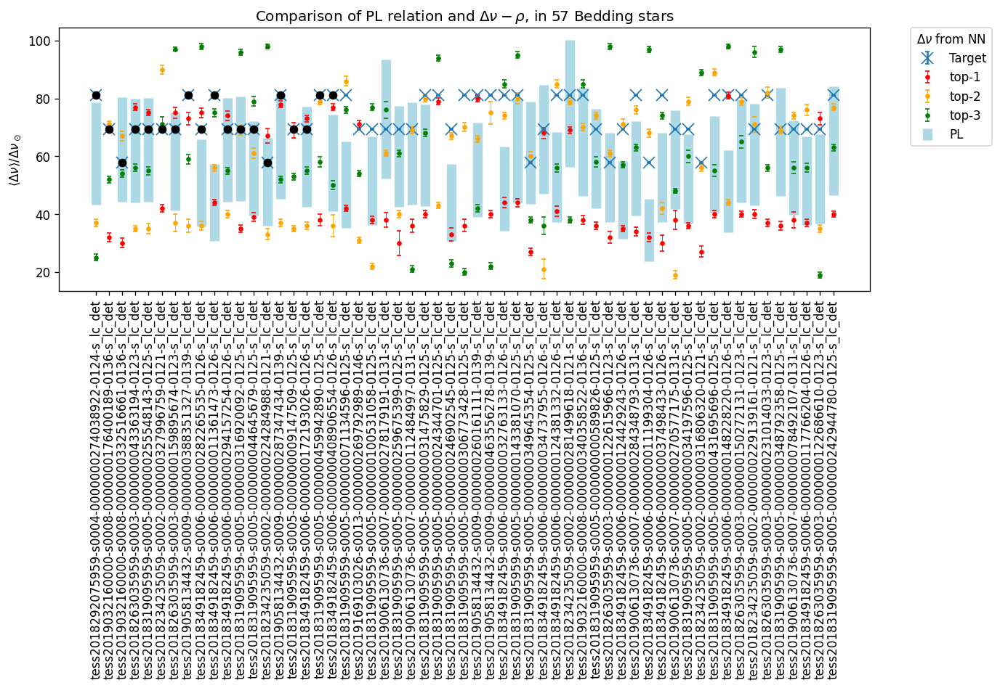

57


In [43]:
plt.subplots(1, figsize=(12, 4), dpi=120)
    
# Prepare data plot
targets = []
inferences = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])

for i, txt in enumerate(ids):
    if ids[i] in stars_fundamental_mode:
        plt.scatter(ids[i], targets[i], color="black", zorder=1000)
        
        
plt.errorbar(
    df["id"],
    df["dnu-target"],
    0.23,
    fmt="x",
    markersize=10,
    capsize=2,
    label="Target"
)

plt.errorbar(
    df["id"],
    df["top1"],
    df["e-top1"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="red",
    label="top-1",
)
plt.errorbar(
    df["id"],
    df["top2"],
    df["e-top2"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="top-2",
)
plt.errorbar(
    df["id"],
    df["top3"],
    df["e-top3"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="top-3",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2,
    df["dnu-from-P-up-fromstarmodel"] - ((df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=10,
    label="PL-From Teff",
    color="blue",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2,
    df["dnu-from-P-up"] - ((df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=0,
    label="PL",
    color="lightblue",
)

        
plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    title=r"$\Delta\nu$ from NN",
)
#plt.gca().add_artist(legend1)
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$")
plt.title("Comparison of PL relation and $\Delta\\nu-\\rho$, in 57 Bedding stars")
#plt.ylim(0, 1.0)
plt.show()
print(len(df.index))

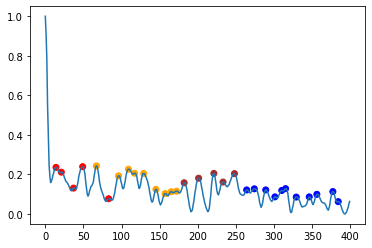

27.000000 - 56.000000
star id: tf.Tensor([b'tess2018234235059-s0002-0000000316806320-0121-s_lc_det'], shape=(1,), dtype=string)
Target 57.87037037037037 t1 27 t2 56 flag False


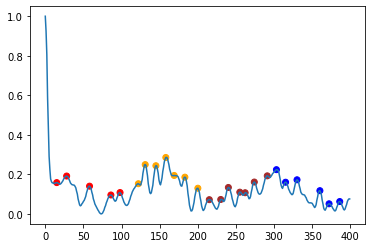

36.000000 - 74.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000000589826-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 36 t2 74 flag False


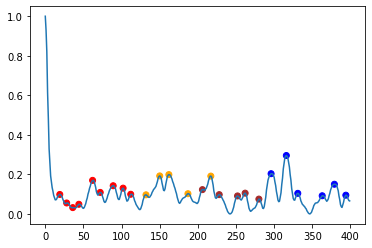

77.000000 - 36.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000408906554-0126-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 77 t2 36 flag True


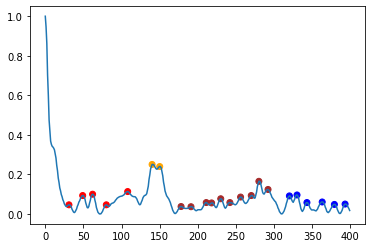

36.000000 - 69.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000348792358-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 36 t2 69 flag False


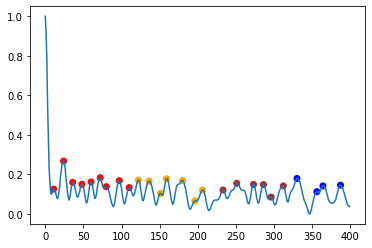

39.000000 - 61.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000044645679-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 39 t2 61 flag False


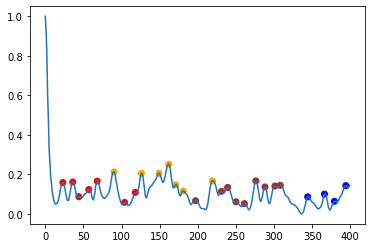

75.000000 - 35.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000255548143-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 75 t2 35 flag True


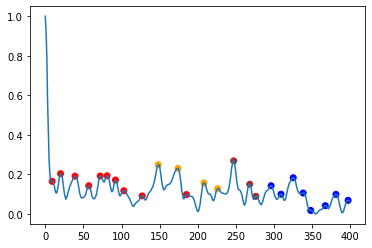

36.000000 - 79.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000034197596-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 36 t2 79 flag False


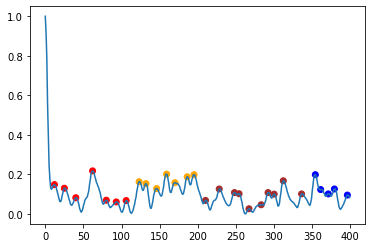

44.000000 - 74.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000032763133-0126-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 44 t2 74 flag False


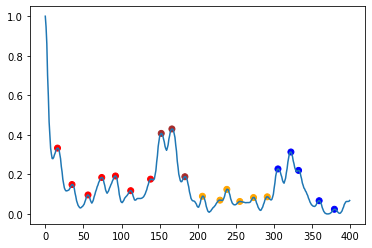

40.000000 - 75.000000
star id: tf.Tensor([b'tess2019058134432-s0009-0000000463556278-0139-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 40 t2 75 flag False


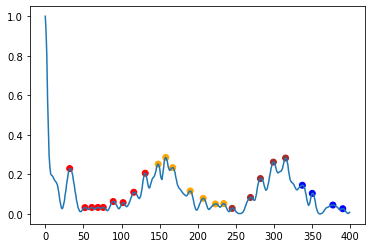

75.000000 - 37.000000
star id: tf.Tensor([b'tess2018263035959-s0003-0000000159895674-0123-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 75 t2 37 flag True


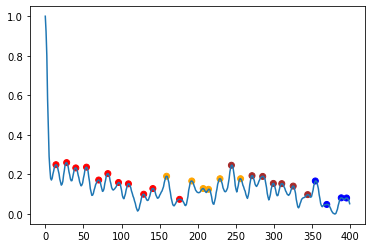

68.000000 - 21.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000034737955-0126-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 68 t2 21 flag True


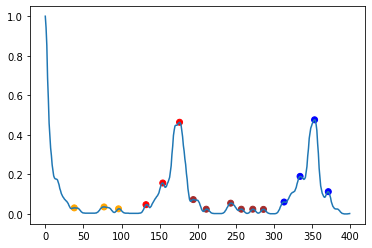

42.000000 - 86.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000071134596-0125-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 42 t2 86 flag False


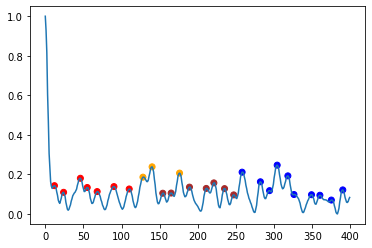

34.000000 - 76.000000
star id: tf.Tensor([b'tess2019006130736-s0007-0000000284348793-0131-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 34 t2 76 flag False


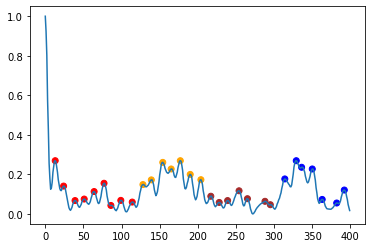

40.000000 - 77.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000242944780-0125-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 40 t2 77 flag False


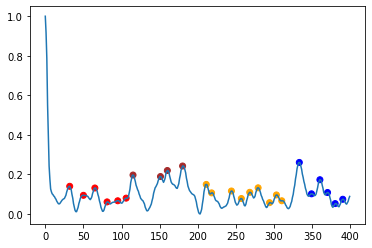

40.000000 - 89.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000431695696-0125-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 40 t2 89 flag False


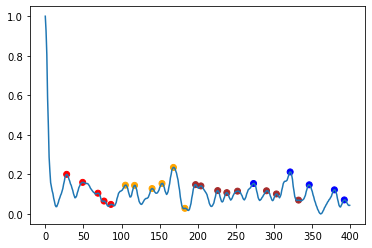

38.000000 - 61.000000
star id: tf.Tensor([b'tess2019006130736-s0007-0000000278179191-0131-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 38 t2 61 flag False


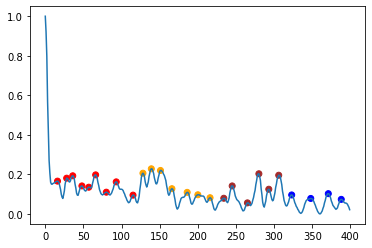

35.000000 - 69.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000316920092-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 35 t2 69 flag False


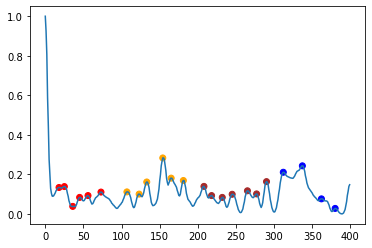

81.000000 - 37.000000
star id: tf.Tensor([b'tess2018292075959-s0004-0000000274038922-0124-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 81 t2 37 flag True


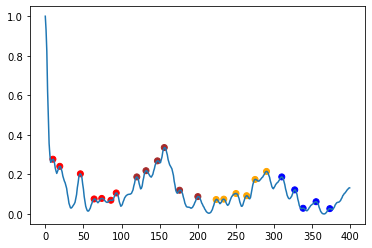

36.000000 - 70.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000306773428-0125-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 36 t2 70 flag False


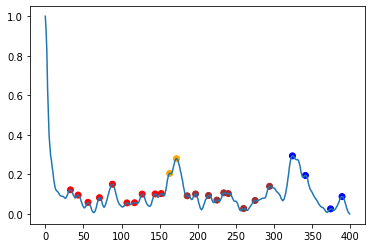

40.000000 - 79.000000
star id: tf.Tensor([b'tess2018263035959-s0003-0000000150272131-0123-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 40 t2 79 flag False


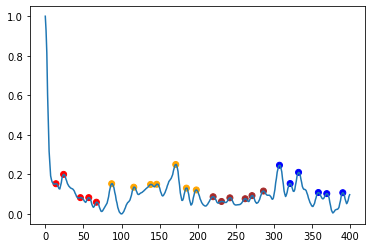

74.000000 - 40.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000294157254-0126-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 74 t2 40 flag True


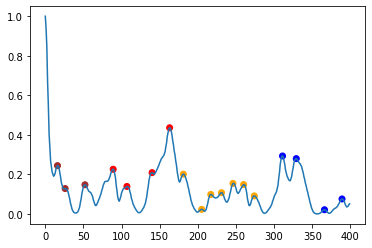

38.000000 - 22.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000100531058-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 38 t2 22 flag True


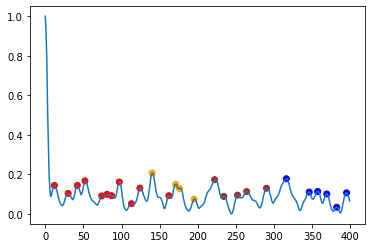

77.000000 - 35.000000
star id: tf.Tensor([b'tess2018263035959-s0003-0000000043363194-0123-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 77 t2 35 flag True


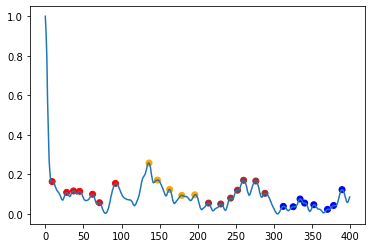

67.000000 - 33.000000
star id: tf.Tensor([b'tess2018234235059-s0002-0000000224284988-0121-s_lc_det'], shape=(1,), dtype=string)
Target 57.87037037037037 t1 67 t2 33 flag True


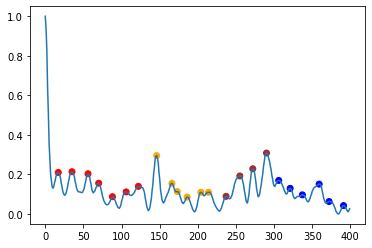

69.000000 - 35.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000009147509-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 69 t2 35 flag True


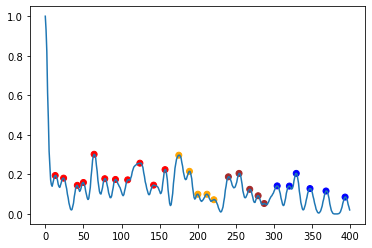

30.000000 - 42.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000037498433-0126-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 30 t2 42 flag False


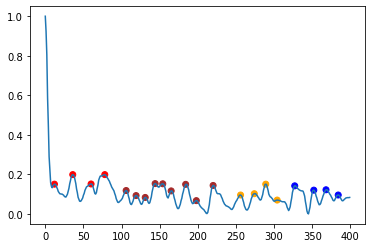

40.000000 - 71.000000
star id: tf.Tensor([b'tess2018234235059-s0002-0000000229139161-0121-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 40 t2 71 flag False


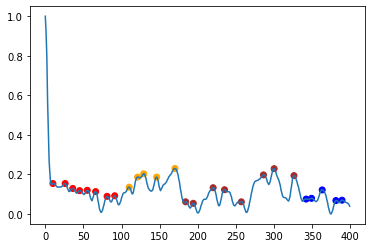

73.000000 - 36.000000
star id: tf.Tensor([b'tess2019058134432-s0009-0000000388351327-0139-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 73 t2 36 flag True


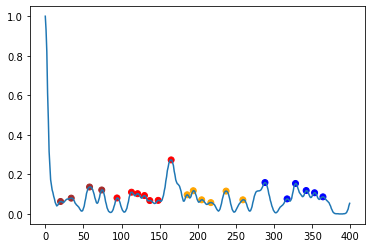

44.000000 - 56.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000011361473-0126-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 44 t2 56 flag False


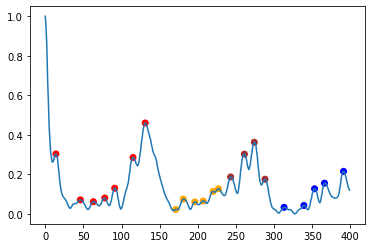

32.000000 - 68.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000011199304-0126-s_lc_det'], shape=(1,), dtype=string)
Target 57.87037037037037 t1 32 t2 68 flag False


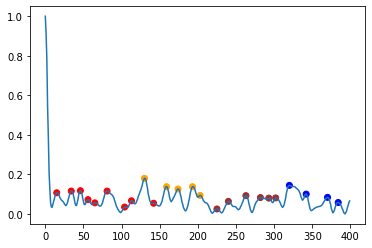

81.000000 - 44.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000148228220-0126-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 81 t2 44 flag True


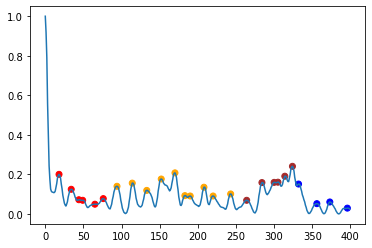

78.000000 - 37.000000
star id: tf.Tensor([b'tess2019058134432-s0009-0000000287347434-0139-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 78 t2 37 flag True


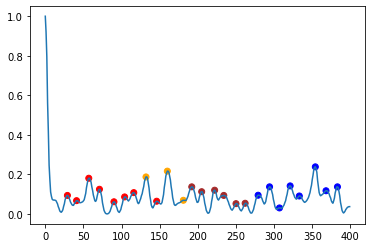

44.000000 - 80.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000143381070-0125-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 44 t2 80 flag False


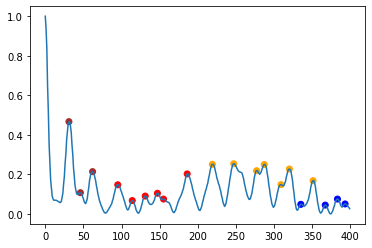

69.000000 - 79.000000
star id: tf.Tensor([b'tess2018234235059-s0002-0000000281499618-0121-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 69 t2 79 flag False


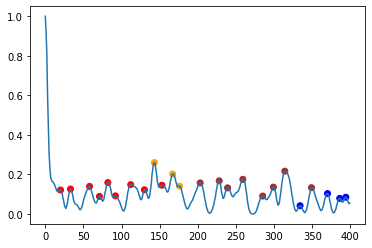

35.000000 - 71.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000124429243-0126-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 35 t2 71 flag False


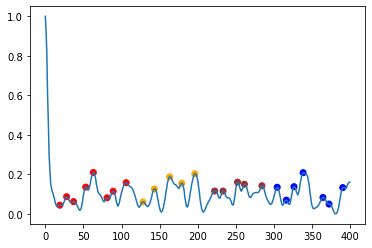

40.000000 - 80.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000031475829-0125-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 40 t2 80 flag False


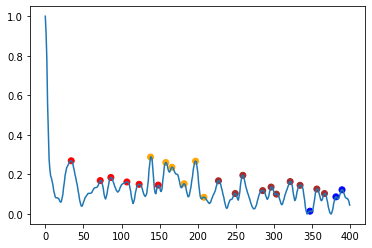

38.000000 - 19.000000
star id: tf.Tensor([b'tess2019006130736-s0007-0000000270577175-0131-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 38 t2 19 flag True


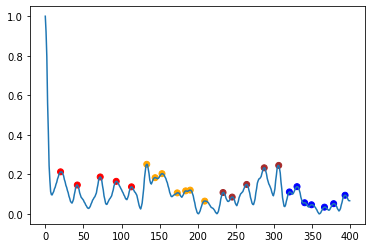

36.000000 - 69.000000
star id: tf.Tensor([b'tess2019006130736-s0007-0000000112484997-0131-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 36 t2 69 flag False


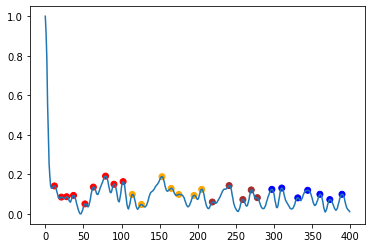

38.000000 - 70.000000
star id: tf.Tensor([b'tess2019032160000-s0008-0000000340358522-0136-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 38 t2 70 flag False


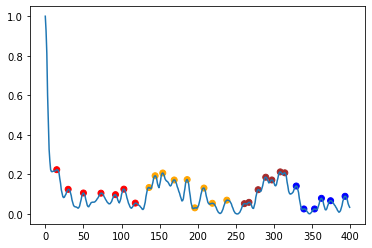

75.000000 - 36.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000282265535-0126-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 75 t2 36 flag True


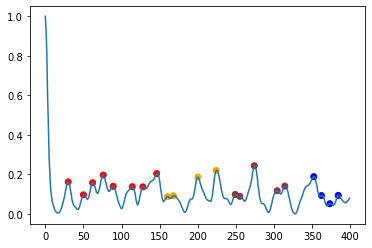

30.000000 - 67.000000
star id: tf.Tensor([b'tess2019032160000-s0008-0000000332516661-0136-s_lc_det'], shape=(1,), dtype=string)
Target 57.87037037037037 t1 30 t2 67 flag False


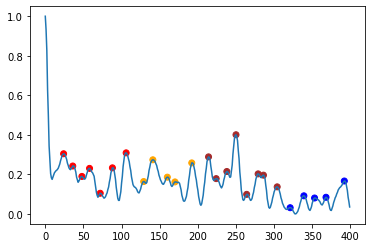

27.000000 - 60.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000349645354-0125-s_lc_det'], shape=(1,), dtype=string)
Target 57.87037037037037 t1 27 t2 60 flag False


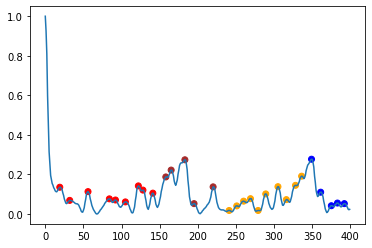

41.000000 - 85.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000124381332-0126-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 41 t2 85 flag False


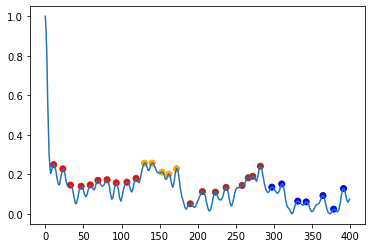

33.000000 - 67.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000246902545-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 33 t2 67 flag False


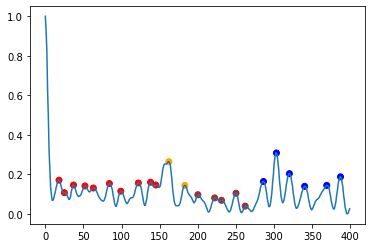

38.000000 - 74.000000
star id: tf.Tensor([b'tess2019006130736-s0007-0000000078492107-0131-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 38 t2 74 flag False


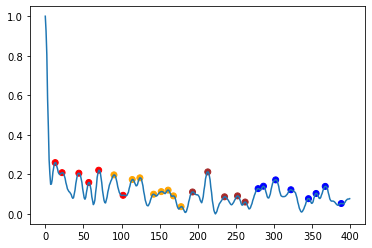

71.000000 - 31.000000
star id: tf.Tensor([b'tess2019169103026-s0013-0000000269792989-0146-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 71 t2 31 flag True


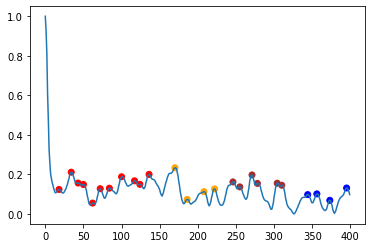

30.000000 - 40.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000259675399-0125-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 30 t2 40 flag False


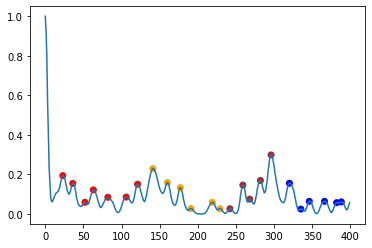

73.000000 - 35.000000
star id: tf.Tensor([b'tess2018263035959-s0003-0000000122686610-0123-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 73 t2 35 flag True


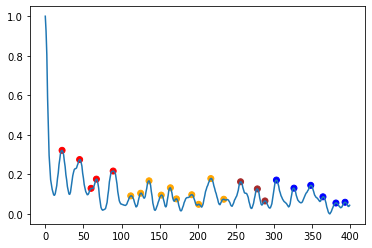

37.000000 - 82.000000
star id: tf.Tensor([b'tess2018263035959-s0003-0000000231014033-0123-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 37 t2 82 flag False


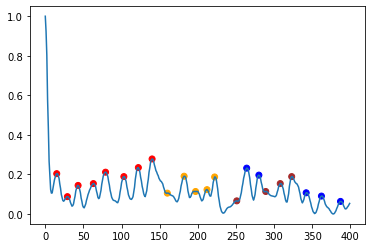

32.000000 - 71.000000
star id: tf.Tensor([b'tess2019032160000-s0008-0000000176400189-0136-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 32 t2 71 flag False


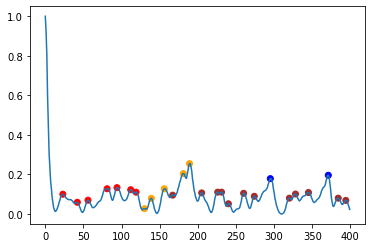

42.000000 - 90.000000
star id: tf.Tensor([b'tess2018234235059-s0002-0000000327996759-0121-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 42 t2 90 flag False


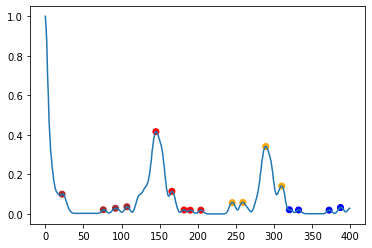

73.000000 - 36.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000172193026-0126-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 73 t2 36 flag True


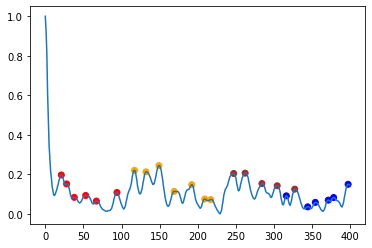

32.000000 - 61.000000
star id: tf.Tensor([b'tess2018263035959-s0003-0000000122615966-0123-s_lc_det'], shape=(1,), dtype=string)
Target 57.87037037037037 t1 32 t2 61 flag False


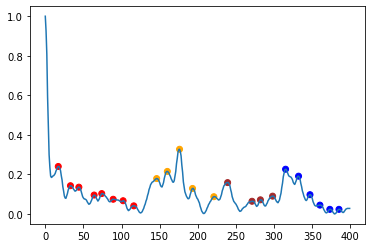

38.000000 - 79.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000459942890-0125-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 38 t2 79 flag False


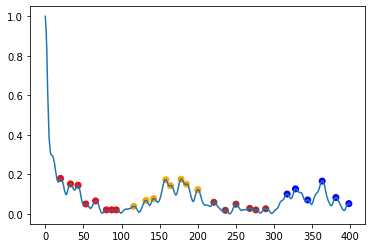

79.000000 - 43.000000
star id: tf.Tensor([b'tess2018319095959-s0005-0000000024344701-0125-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 79 t2 43 flag True


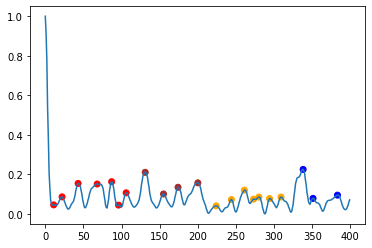

80.000000 - 66.000000
star id: tf.Tensor([b'tess2019058134432-s0009-0000000260161111-0139-s_lc_det'], shape=(1,), dtype=string)
Target 81.01851851851852 t1 80 t2 66 flag True


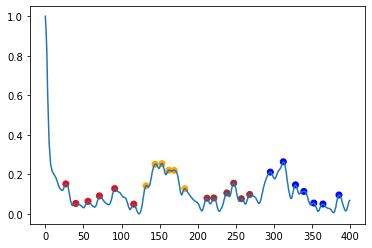

37.000000 - 76.000000
star id: tf.Tensor([b'tess2018349182459-s0006-0000000117766204-0126-s_lc_det'], shape=(1,), dtype=string)
Target 69.44444444444444 t1 37 t2 76 flag False


In [44]:
# Save results and predictions
gmm_clust_stds = []
gmm_peaks = []
gmm_clust_minmax = []
is_multiple = []
y_mod = []
peaks_clust_top1 = []
peaks_clust_top2 = []
star_ids = []
_silhouette_avg = []
for star in df_bedding.take(57):  # take the stars
    target = np.where(star[2].numpy().flat == 1)[0].flat[0] / 0.0864
    # Save results
    if star[0].numpy()[0].decode("utf-8") not in results:
        results[star[0].numpy()[0].decode("utf-8")] = {
            "dnu-target": target,
        }

    # Get vector corresponding to DFT
    aux = star[1][0, :, 0].numpy()
    
    # Get all peaks
    peaks, peaks_pos = find_peaks(aux, height=0.0, distance=5)
    peaks_width = peak_widths(aux, peaks)
    peaks_sorted_by_prob = np.sort(aux[peaks])[::-1]

    # Adjust mixture of gaussians on peaks and hegight
    peaks_clust = np.vstack((peaks, peaks_pos["peak_heights"])).T
    # Fit model
    gmmModel = GaussianMixture(n_components=4, covariance_type="full", random_state=123).fit(
        peaks_clust
    )
    # Plot
    colors = ["red", "green", "blue", "purple", "orange", "brown"]
    plt.scatter(
        peaks,
        peaks_pos["peak_heights"],
        c=gmmModel.predict(peaks_clust),
        cmap=matplotlib.colors.ListedColormap(colors),
    )
    plt.plot(aux)
    plt.show()


    si_coef = []
    n_components = np.arange(2, 10)
    for n_c in n_components:

        model = GaussianMixture(n_c, covariance_type='full', random_state=0).fit(peaks_clust)
        cluster_labels = model.predict(peaks_clust)
        silhouette_avg = silhouette_score(peaks_clust, cluster_labels)
        si_coef.append(silhouette_avg)
        #print("For n_clusters =", n_c, "The average silhouette_score is :", silhouette_avg)
    #plt.plot(si_coef)
    #plt.show()

    # Get star info to create a y_label   
    _star_id = star[0].numpy()[0].decode("utf-8")
    _top1 = df[df["id"]==_star_id]["top1"].values[0]
    _target = df[df["id"]==_star_id]["dnu-target"].values[0]


    
    # Check if top-1 and top-2 is a multiple
    t1 = df[df["id"]==_star_id]["top1"].values[0]
    t2 = df[df["id"]==_star_id]["top2"].values[0]
    print("%f - %f" % (t1, t2))
    mult = -1
    if t1 > t2:
        mult = t1 % t2
    else:
        mult = t2 % t1
    is_multiple.append(mult < 5)
    
    if np.abs(_target - t1) < np.abs(_target - t2):
        y_mod.append(True)
    else:
        y_mod.append(False)

    print("star id: %s" % star[0])
    print("Target",_target,"t1",t1,"t2",t2,"flag",np.abs(_target - t1) < np.abs(_target - t2))

    # Add std of covariances
    gmm_clust_stds.append(np.std(gmmModel.covariances_))
    gmm_peaks.append(peaks.shape[0])
    gb = pd.DataFrame({"peaks":peaks, "clust":gmmModel.predict(peaks_clust)}).groupby(['clust'])
    gmm_clust_minmax.append(np.mean(np.abs(gb.agg([np.min]).values - gb.agg([np.max]).values)[0]))

    gb_agg = gb.agg(np.sum)
    t1_clust = gmmModel.predict(np.asarray([t1,1]).reshape(-1, 2))
    t2_clust =gmmModel.predict(np.asarray([t2,1]).reshape(-1, 2))
    peaks_clust_top1.append(gb_agg.iloc[t1_clust].values[0][0])
    peaks_clust_top2.append(gb_agg.iloc[t2_clust].values[0][0])
    top1_gr_top2.append(t1 > t2)

    star_ids.append(_star_id)
    _silhouette_avg.append(np.argmax(np.diff(si_coef)))

    print("=================================================")

In [45]:
gmm_clust = np.vstack((gmm_clust_stds, gmm_peaks, gmm_clust_minmax, is_multiple, peaks_clust_top1, peaks_clust_top2))
gmm_clust = gmm_clust.reshape(57, 6)

gmm_clust_data = pd.DataFrame({
                                "clust_cov_stds":gmm_clust_stds, 
                                "peaks_number":gmm_peaks, 
                                "std_min_max_clust":gmm_clust_minmax, 
                                "has_mult": is_multiple,
                                "peaks_clust_top1": peaks_clust_top1,
                                "peaks_clust_top2": peaks_clust_top2,
                                "y_mod":y_mod,
                                "star_ids": star_ids,
                                "sil": _silhouette_avg
                                })

gmm_clust_data

,clust_cov_stds,peaks_number,std_min_max_clust,has_mult,peaks_clust_top1,peaks_clust_top2,y_mod,star_ids,sil
0,480.364354,30,69.0,True,204,204,False,tess2018234235059-s0002-0000000316806320-0121-...,3
1,363.180382,25,83.0,True,1108,1108,False,tess2018319095959-s0005-0000000000589826-0125-...,1
2,483.119804,25,93.0,False,2079,2079,True,tess2018349182459-s0006-0000000408906554-0126-...,4
3,371.755527,23,77.0,False,330,330,False,tess2018319095959-s0005-0000000348792358-0125-...,4
4,412.768059,26,99.0,False,538,538,False,tess2018319095959-s0005-0000000044645679-0125-...,3
5,513.240952,27,95.0,False,1098,1098,True,tess2018319095959-s0005-0000000255548143-0125-...,2
6,655.966635,25,176.0,False,2761,2761,False,tess2018319095959-s0005-0000000034197596-0125-...,4
7,446.470520,29,94.0,False,418,418,False,tess2018349182459-s0006-0000000032763133-0126-...,1
8,439.653770,21,122.0,False,501,501,False,tess2019058134432-s0009-0000000463556278-0139-...,3
9,340.556954,25,99.0,True,728,728,True,tess2018263035959-s0003-0000000159895674-0123-...,4


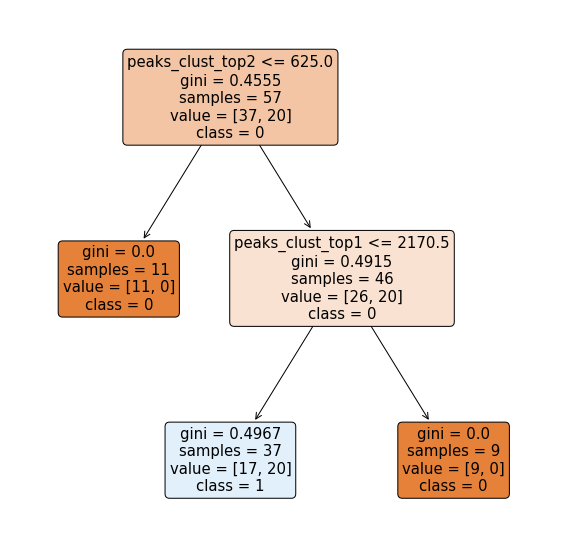

In [46]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree


clf_b = DecisionTreeClassifier(random_state=0, max_depth=2)
clf_b.fit(gmm_clust_data[selected_vars_gmm], gmm_clust_data[["y_mod"]])
plt.figure(figsize=(10, 10))
dec_tree = plot_tree(
    decision_tree=clf_b,
    feature_names=selected_vars_gmm,
    class_names=["0", "1"],
    filled=True,
    precision=4,
    rounded=True,
)

In [47]:
confusion_matrix(y_mod, clf.predict(gmm_clust_data[selected_vars_gmm]))

array([[ 6, 31],
       [ 2, 18]])

In [48]:
print(classification_report(y_mod, clf.predict(gmm_clust_data[selected_vars_gmm])))

              precision    recall  f1-score   support

       False       0.75      0.16      0.27        37
        True       0.37      0.90      0.52        20

    accuracy                           0.42        57
   macro avg       0.56      0.53      0.39        57
weighted avg       0.62      0.42      0.36        57



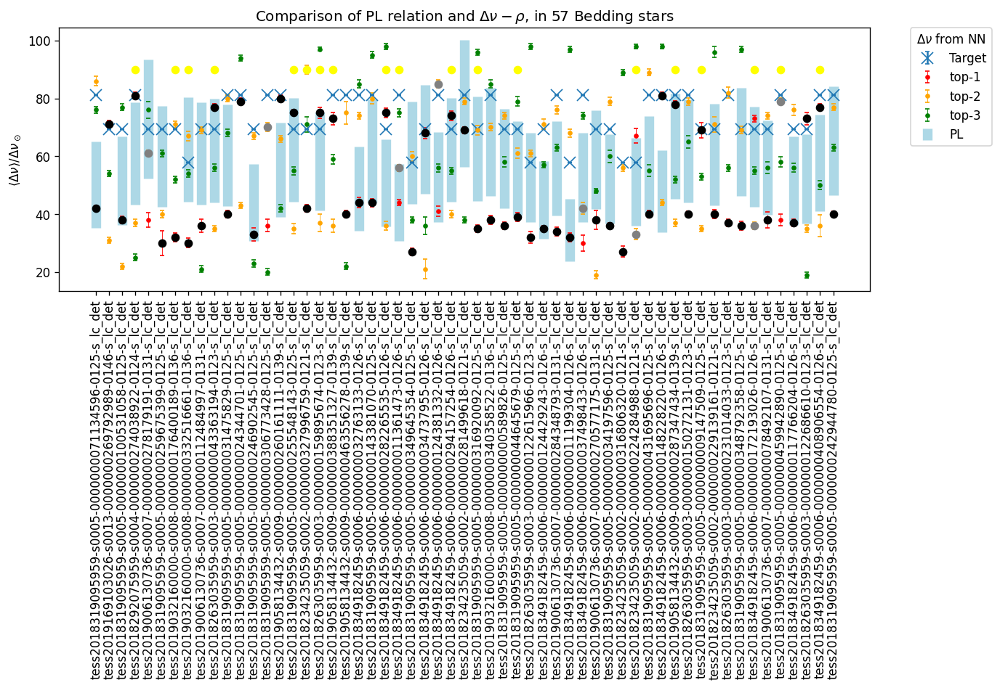

57


In [49]:
plt.subplots(1, figsize=(12, 4), dpi=120)
    
# Prepare data plot
targets = []
inferences = []
inferences_top2 = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])
    inferences_top2.append(results[tess_id]["top2"])


for i, txt in enumerate(ids):
    if ids[i] in stars_fundamental_mode:
        plt.scatter(ids[i], 90, color="yellow", zorder=1000)
    # get prediction
    flag = clf.predict(gmm_clust_data[gmm_clust_data["star_ids"]==ids[i]][selected_vars_gmm].values)
    if flag:
        plt.scatter(ids[i], inferences[i], color="black", zorder=1000)
    else:
        plt.scatter(ids[i], inferences_top2[i], color="grey", zorder=1000)

        
plt.errorbar(
    df["id"],
    df["dnu-target"],
    0,
    fmt="x",
    markersize=10,
    capsize=2,
    label="Target"
)
plt.errorbar(
    df["id"],
    df["top1"],
    df["e-top1"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="red",
    label="top-1",
)
plt.errorbar(
    df["id"],
    df["top2"],
    df["e-top2"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="top-2",
)
plt.errorbar(
    df["id"],
    df["top3"],
    df["e-top3"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="top-3",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2,
    df["dnu-from-P-up-fromstarmodel"] - ((df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=10,
    label="PL-From Teff",
    color="blue",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2,
    df["dnu-from-P-up"] - ((df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=0,
    label="PL",
    color="lightblue",
)

        
plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    title=r"$\Delta\nu$ from NN",
)
#plt.gca().add_artist(legend1)
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$")
plt.title("Comparison of PL relation and $\Delta\\nu-\\rho$, in 57 Bedding stars")
#plt.ylim(0, 1.0)
plt.show()
print(len(df.index))

In [50]:
df_att["Dnu"] = np.nan
df_att["Dnu-top1"] = np.nan
df_att["Dnu-top2"] = np.nan
df_att["Dnu-top3"] = np.nan
df_att["Dnu-top1-e"] = np.nan
df_att["Dnu-top2-e"] = np.nan
df_att["Dnu-top3-e"] = np.nan
df_att["rho-top1"] = np.nan
df_att["rho-top2"] = np.nan
df_att["rho-top3"] = np.nan
df_att["rho-top1-e"] = np.nan
df_att["rho-top2-e"] = np.nan
df_att["rho-top3-e"] = np.nan


for result in results:
    i = str(int(result.split("-")[2]))
    print(results[result])
    # Dnus
    df_att.loc[df_att.TIC == i, ['Dnu-top1']] = results[result]["top1"]
    df_att.loc[df_att.TIC == i, ['Dnu-top2']] = results[result]["top2"]
    df_att.loc[df_att.TIC == i, ['Dnu-top3']] = results[result]["top3"]
    df_att.loc[df_att.TIC == i, ['Dnu-top1-e']] = results[result]["e-top1"]
    df_att.loc[df_att.TIC == i, ['Dnu-top2-e']] = results[result]["e-top2"]
    df_att.loc[df_att.TIC == i, ['Dnu-top3-e']] = results[result]["e-top3"]
    # Rhos
    df_att.loc[df_att.TIC == i, ['rho-top1']] = get_rho(np.asarray(results[result]["top1"]) / dnu_sun)
    df_att.loc[df_att.TIC == i, ['rho-top2']] = get_rho(np.asarray(results[result]["top2"]) / dnu_sun)
    df_att.loc[df_att.TIC == i, ['rho-top3']] = get_rho(np.asarray(results[result]["top3"]) / dnu_sun)
    
    df_att.loc[df_att.TIC == i, ['rho-top1-e']] = rho_error(np.float64(np.asarray(results[result]["top1"]) / dnu_sun))
    df_att.loc[df_att.TIC == i, ['rho-top2-e']] = rho_error(np.float64(np.asarray(results[result]["top2"]) / dnu_sun))
    df_att.loc[df_att.TIC == i, ['rho-top3-e']] = rho_error(np.float64(np.asarray(results[result]["top3"]) / dnu_sun))

': 61.883120996995984, 'dnu-from-P-down-fromstarmodel': 33.42583558981102, 'dnu-from-P-up': 66.77105477589417, 'dnu-from-P-down': 36.30776832729438}
{'dnu-target': 81.01851851851852, 'top1': 81, 'e-top1': 1.0329500610163365, 'top2': 37, 'e-top2': 1.3439763089263934, 'top3': 25, 'e-top3': 1.0959203370671773, 'top4': 67, 'e-top4': 1.2784319437090375, 'dnu-from-P-up-fromstarmodel': 67.11915701522535, 'dnu-from-P-down-fromstarmodel': 36.513417976385156, 'dnu-from-P-up': 78.5282884532431, 'dnu-from-P-down': 43.27858589065352}
{'dnu-target': 69.44444444444444, 'top1': 38, 'e-top1': 2.5347772343876542, 'top2': 61, 'e-top2': 1.0144337036832098, 'top3': 76, 'e-top3': 2.8329859137409983, 'top4': 21, 'e-top4': 1.270569419336212, 'dnu-from-P-up-fromstarmodel': 89.82479209037282, 'dnu-from-P-down-fromstarmodel': 50.01379272689409, 'dnu-from-P-up': 93.47106633988497, 'dnu-from-P-down': 52.19341785030255}
{'dnu-target': 69.44444444444444, 'top1': 30, 'e-top1': 4.23629308499391, 'top2': 40, 'e-top2': 

In [51]:
df_att.keys()

Index(['HD', 'Name', 'TIC', 'V', 'Teff', 'L', 'e.L.', 'rho', 'e.rho.', 'Dnu',
       'eps', 'vsini', 'e.vsini.', 'F0', 'logg', 'Teff_mast', 'e_logg',
       'e_Teff_mast', 'stellar_radius', 'e_stellar_radius', 'Dnu-top1',
       'Dnu-top2', 'Dnu-top3', 'Dnu-top1-e', 'Dnu-top2-e', 'Dnu-top3-e',
       'rho-top1', 'rho-top2', 'rho-top3', 'rho-top1-e', 'rho-top2-e',
       'rho-top3-e'],
      dtype='object')

In [52]:
# Save csv
df_att[["HD", "TIC", "logg", "e_logg", "Teff_mast", "e_Teff_mast", "vsini", "e.vsini.", "Dnu-top1", "Dnu-top2", "Dnu-top3", "Dnu-top1-e", "Dnu-top2-e", "Dnu-top3-e",  "rho-top1", "rho-top2", "rho-top3", "rho-top1-e", "rho-top2-e", "rho-top3-e"]].to_csv("../bedding_nn.csv", index=False, header=True)

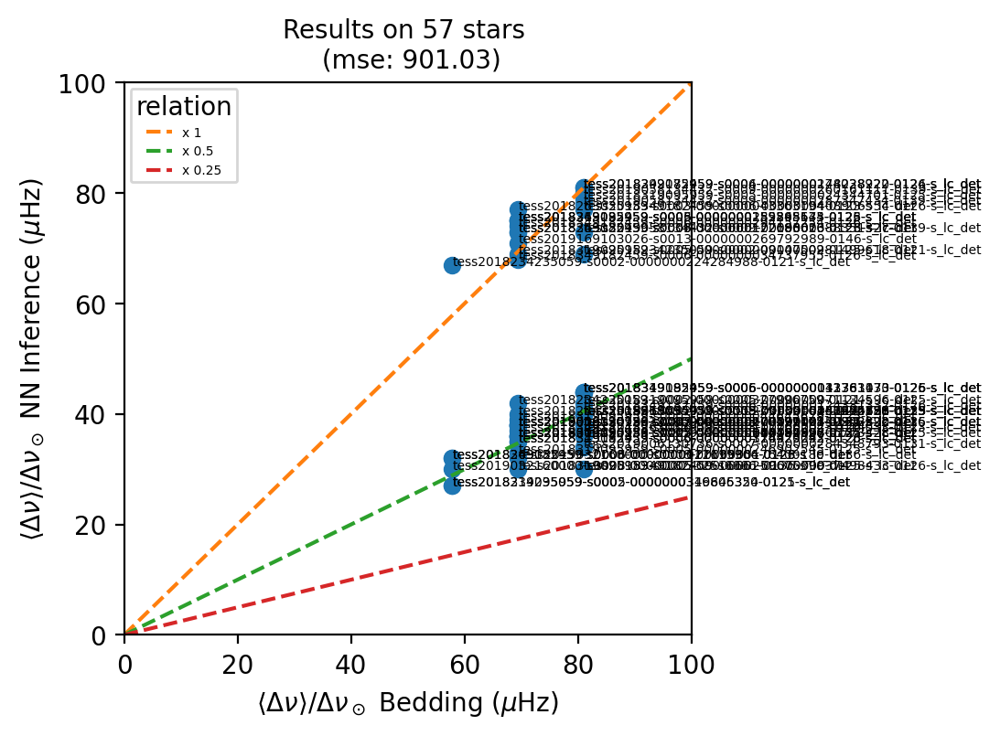

In [53]:
# Prepare data plot
targets = []
inferences = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])
    
# Set lims
plt.subplots(1, figsize=(4, 4), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
plt.legend(title="relation", fontsize=5)
plt.xlabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$ Bedding ($\mu$Hz)")
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$ NN Inference ($\mu$Hz)")
plt.title("Results on 57 stars \n (mse: %s)" % np.round(np.mean(np.power(np.asarray(targets)-np.asarray(inferences), 2)),2), fontsize=10)
plt.show()

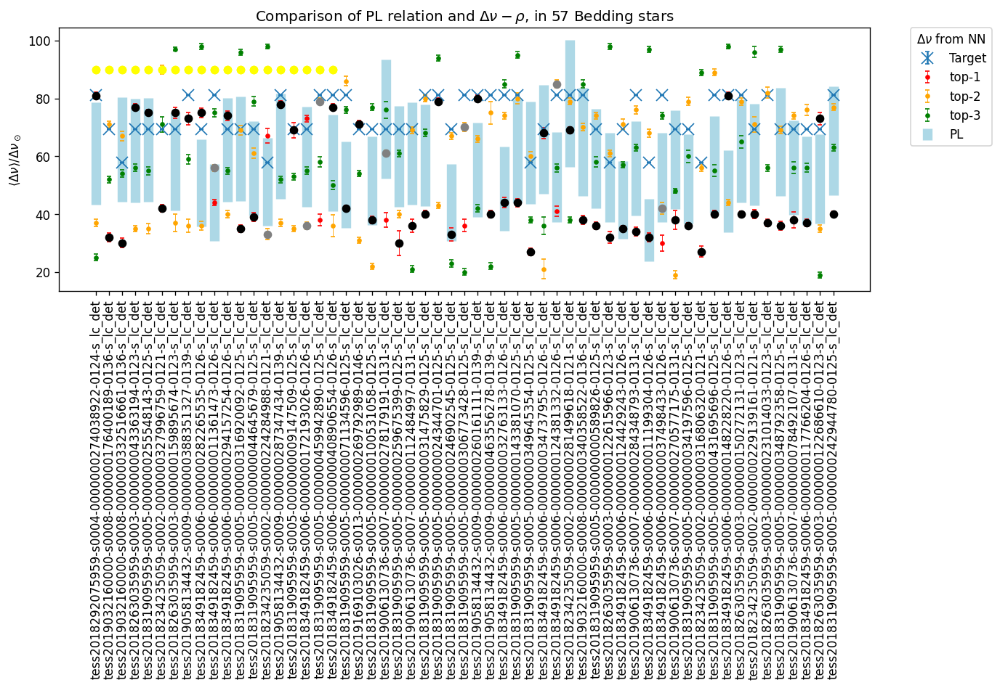

57


In [54]:
plt.subplots(1, figsize=(12, 4), dpi=120)
    
# Prepare data plot
targets = []
inferences = []
inferences_top2 = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])
    inferences_top2.append(results[tess_id]["top2"])

for i, txt in enumerate(ids):
    if ids[i] in stars_fundamental_mode:
        plt.scatter(ids[i], 90, color="yellow", zorder=1000)
        
    
for i, txt in enumerate(ids):
    if ids[i] in stars_fundamental_mode:
        plt.scatter(ids[i], 90, color="yellow", zorder=1000)
    # get prediction
    flag = clf.predict(gmm_clust_data[gmm_clust_data["star_ids"]==ids[i]][selected_vars_gmm].values)
    if flag:
        plt.scatter(ids[i], inferences[i], color="black", zorder=1000)
    else:
        plt.scatter(ids[i], inferences_top2[i], color="grey", zorder=1000)

        
plt.errorbar(
    df["id"],
    df["dnu-target"],
    0,
    fmt="x",
    markersize=10,
    capsize=2,
    label="Target"
)
plt.errorbar(
    df["id"],
    df["top1"],
    df["e-top1"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="red",
    label="top-1",
)
plt.errorbar(
    df["id"],
    df["top2"],
    df["e-top2"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="top-2",
)
plt.errorbar(
    df["id"],
    df["top3"],
    df["e-top3"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="top-3",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2,
    df["dnu-from-P-up-fromstarmodel"] - ((df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=10,
    label="PL-From Teff",
    color="blue",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2,
    df["dnu-from-P-up"] - ((df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=0,
    label="PL",
    color="lightblue",
)

        
plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    title=r"$\Delta\nu$ from NN",
)
#plt.gca().add_artist(legend1)
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$")
plt.title("Comparison of PL relation and $\Delta\\nu-\\rho$, in 57 Bedding stars")
#plt.ylim(0, 1.0)
plt.show()
print(len(df.index))

In [55]:
a = df["dnu-from-P-up"] + df["dnu-from-P-down"] / 2
b = np.asarray(targets)
flag = ~np.isnan(a-b)
print(np.corrcoef(a[flag], b[flag]))
print(np.mean(a[flag] - b[flag]))


a = df["dnu-from-P-up"] + df["dnu-from-P-down"] / 2
b = np.asarray(inferences)
flag = ~np.isnan(a-b)
print(np.corrcoef(a[flag], b[flag]))
print(np.mean(a[flag] - b[flag]))

[[1.         0.14860421]
 [0.14860421 1.        ]]
21.36617785910847
[[1.        0.1591296]
 [0.1591296 1.       ]]
44.82068671579123


In [56]:
# Are radial modes fit with NN ?

sign = np.abs(np.asarray(targets) - np.asarray(inferences)) < 10
np.count_nonzero(sign)

vals = np.asarray(targets, dtype=float)[sign==True] 

df[sign==True]

"""

HD 20232 : tess2018263035959-s0003-0000000159895674-0123 : SI [no hay Luminosidad disponible]
HD 24975 : tess2018319095959-s0005-0000000044645679-0125 : NO
HD 25248 : tess2018319095959-s0005-0000000459942890-0125 : NO [no hay Luminosidad disponible]
HD 25369 : tess2018319095959-s0005-0000000009147509-0125 : SI [no hay Luminosidad disponible]
HD 31901 : tess2018319095959-s0005-0000000316920092-0125 : NO (SI con L)
HD 20203 : tess2018292075959-s0004-0000000274038922-0124 : SI
HD 40317 : tess2018349182459-s0006-0000000282265535-0126 : SI
HD 42005 : tess2018349182459-s0006-0000000408906554-0126 : SI
HD 44958 : tess2018319095959-s0005-0000000255548143-0125 : SI
HD 46722 : tess2018349182459-s0006-0000000172193026-0126 : SI
HD 55863 : tess2018349182459-s0006-0000000294157254-0126 : SI
HD 99506 : tess2019058134432-s0009-0000000287347434-0139 : SI
HD 290799: tess2018349182459-s0006-0000000011361473-0126 : NO [Valor de Bedding fuera de ventana L]
-----------------------------------------------------------------------------------------------
> HD 187547 : KIC7548479 ???
HD 70510 : tess2019058134432-s0009-0000000388351327-0139 : SI
HD 75040 : tess2019032160000-s0008-0000000176400189-0136 : NO [no hay Luminosidad disponible]
HD 3622  : tess2018263035959-s0003-0000000043363194-0123 : SI
HD 220811: tess2018234235059-s0002-0000000327996759-0121 : NO [no hay Luminosidad disponible]
HD 223011: tess2018234235059-s0002-0000000224284988-0121 : SI
HD 78198: tess2019032160000-s0008-0000000332516661-0136 :  NO (SI con L)

Totales:
12(si)/19(total) = 63%
14(si)/19(total) = 73%

Solo las identificadas:
9(si) /13(total)  = 69%
10(si)/13(total) = 76%


>(no) HD 32433 : tess2018319095959-s0005-0000000348792358-0125 : NO (SI con L)
"""

'\n\nHD 20232 : tess2018263035959-s0003-0000000159895674-0123 : SI [no hay Luminosidad disponible]\nHD 24975 : tess2018319095959-s0005-0000000044645679-0125 : NO\nHD 25248 : tess2018319095959-s0005-0000000459942890-0125 : NO [no hay Luminosidad disponible]\nHD 25369 : tess2018319095959-s0005-0000000009147509-0125 : SI [no hay Luminosidad disponible]\nHD 31901 : tess2018319095959-s0005-0000000316920092-0125 : NO (SI con L)\nHD 20203 : tess2018292075959-s0004-0000000274038922-0124 : SI\nHD 40317 : tess2018349182459-s0006-0000000282265535-0126 : SI\nHD 42005 : tess2018349182459-s0006-0000000408906554-0126 : SI\nHD 44958 : tess2018319095959-s0005-0000000255548143-0125 : SI\nHD 46722 : tess2018349182459-s0006-0000000172193026-0126 : SI\nHD 55863 : tess2018349182459-s0006-0000000294157254-0126 : SI\nHD 99506 : tess2019058134432-s0009-0000000287347434-0139 : SI\nHD 290799: tess2018349182459-s0006-0000000011361473-0126 : NO [Valor de Bedding fuera de ventana L]\n-------------------------------

In [57]:
df.head(1)

,id,dnu-target,top1,e-top1,top2,e-top2,top3,e-top3,top4,e-top4,dnu-from-P-up-fromstarmodel,dnu-from-P-down-fromstarmodel,dnu-from-P-up,dnu-from-P-down
0,tess2018319095959-s0005-0000000071134596-0125-...,81.018519,42,1.101737,86,1.712817,76,1.244492,65,1.0895,59.88466,32.250885,65.021403,35.274913


In [58]:
results_bedding= pd.DataFrame(
    columns=[
        "id",
        "dnu-target",
        "e-dnu-target",
        "dnu-from-P",
        "e-dnu-from-P",
        "best-top",
        "e-best-top",
        "ktop",
        "top1",
        "e-top1",
        "top2",
        "e-top2"
    ]
)

for index, row in df.iterrows():
    print("Proccessing star %s" % row["id"])
    print("PL[%f,%f]" % (row["dnu-from-P-up"], row["dnu-from-P-down"]))
    # Top index to search on 
    top_indexs = ["top1", "top2"]
    best = np.nan # empty on start
    # Center of PL window
    central_pl_window = row["dnu-from-P-up"]-((row["dnu-from-P-up"]-row["dnu-from-P-down"])/2)
    # Check predictions indise L window
    inside_pl_window = []
    for top_index in top_indexs:
        flag_full_inside = (row[top_index] + row["e-%s" % (top_index)] <= row["dnu-from-P-up"]) & (row[top_index] - row["e-%s" % (top_index)] >= row["dnu-from-P-down"])
        flag_partial =  ((row[top_index] - row["e-%s" % (top_index)] >= row["dnu-from-P-down"]) & (row[top_index] - row["e-%s" % (top_index)] <= row["dnu-from-P-up"])) | ((row[top_index] + row["e-%s" % (top_index)] >= row["dnu-from-P-down"]) & (row[top_index] + row["e-%s" % (top_index)] <= row["dnu-from-P-up"])) 
        if flag_full_inside or flag_partial:
            inside_pl_window.append(top_index)
    print("   =>Inside PL window: %s" % inside_pl_window)

    if (len(inside_pl_window) > 0) and (not np.isnan(row["dnu-from-P-up"])):
        print("=>",inside_pl_window)
        top_index = inside_pl_window[0] # Get most probable from NN
        
        # Get best
        best = row["%s" % (top_index)]
        results_bedding.loc[len(results_bedding)] = [
                        row["id"],
                        row["dnu-target"],
                        0.23,
                        (row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2,
                        row["dnu-from-P-up"] - ((row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2),
                        best,
                        row["e-%s" % top_index],
                        top_index,
                        row["top1"],
                        row["e-top1"],
                        row["top2"],
                        row["e-top2"]
                    ]
    else:
        # Get closest inference to the center of PL window
        top_index = np.argmin([np.abs(row[top_index]-central_pl_window) for top_index in top_indexs])
        # Check if predictions is not inside window
        # Get best
        best = row["top%s" % (top_index+1)]
        results_bedding.loc[len(results_bedding)] = [
                        row["id"],
                        row["dnu-target"],
                        0.23,
                        (row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2,
                        row["dnu-from-P-up"] - ((row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2),
                        best,
                        row["e-top%s" % (top_index+1)],
                        top_index,
                        row["top1"],
                        row["e-top1"],
                        row["top2"],
                        row["e-top2"]
                    ]

Proccessing star tess2018319095959-s0005-0000000071134596-0125-s_lc_det
PL[65.021403,35.274913]
   =>Inside PL window: ['top1']
=> ['top1']
Proccessing star tess2019169103026-s0013-0000000269792989-0146-s_lc_det
PL[nan,nan]
   =>Inside PL window: []
Proccessing star tess2018319095959-s0005-0000000100531058-0125-s_lc_det
PL[66.771055,36.307768]
   =>Inside PL window: ['top1']
=> ['top1']
Proccessing star tess2018292075959-s0004-0000000274038922-0124-s_lc_det
PL[78.528288,43.278586]
   =>Inside PL window: []
Proccessing star tess2019006130736-s0007-0000000278179191-0131-s_lc_det
PL[93.471066,52.193418]
   =>Inside PL window: ['top2']
=> ['top2']
Proccessing star tess2018319095959-s0005-0000000259675399-0125-s_lc_det
PL[77.361676,42.584862]
   =>Inside PL window: []
Proccessing star tess2019032160000-s0008-0000000176400189-0136-s_lc_det
PL[nan,nan]
   =>Inside PL window: []
Proccessing star tess2019032160000-s0008-0000000332516661-0136-s_lc_det
PL[80.266927,44.313175]
   =>Inside PL windo

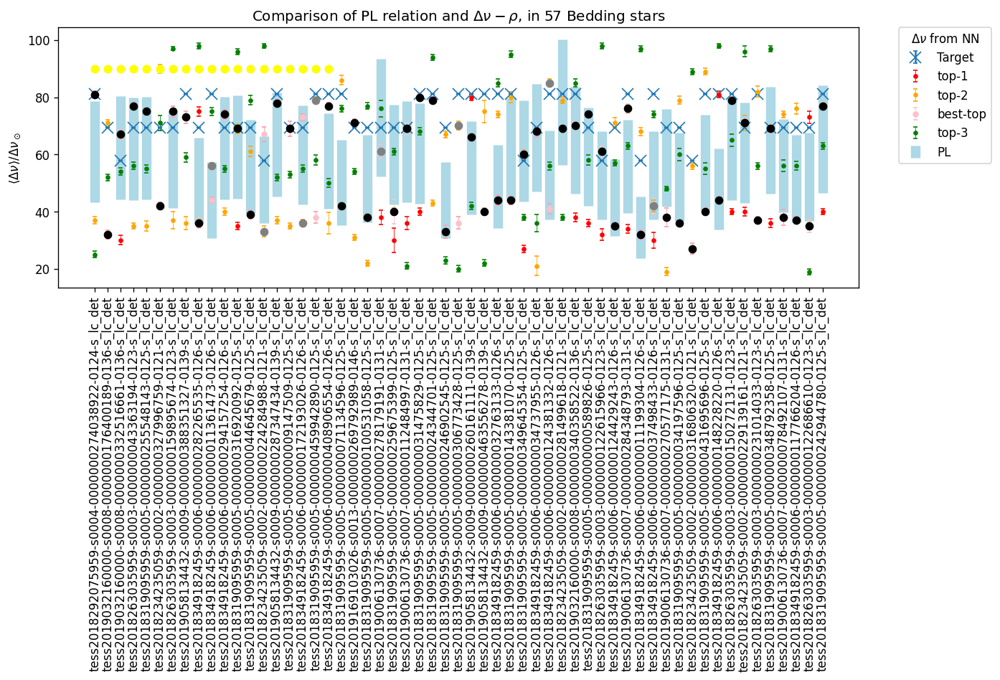

57


In [59]:
targets = results_bedding["dnu-target"]
inferences = results_bedding["best-top"]
inferences_top2 = results_bedding["top2"]

ids = results_bedding["id"]

plt.subplots(1, figsize=(12, 4), dpi=120)


for i, txt in enumerate(ids):
    if ids[i] in stars_fundamental_mode:
        plt.scatter(ids[i], 90, color="yellow", zorder=1000)
        
    
for i, txt in enumerate(ids):
    if ids[i] in stars_fundamental_mode:
        plt.scatter(ids[i], 90, color="yellow", zorder=1000)
    # get prediction
    flag = clf.predict(gmm_clust_data[gmm_clust_data["star_ids"]==ids[i]][selected_vars_gmm].values)
    if flag:
        plt.scatter(ids[i], inferences[i], color="black", zorder=1000)
    else:
        plt.scatter(ids[i], inferences_top2[i], color="grey", zorder=1000)
        
plt.errorbar(
    results_bedding["id"],
    results_bedding["dnu-target"],
    0,
    fmt="x",
    markersize=10,
    capsize=2,
    label="Target"
)
plt.errorbar(
    results_bedding["id"],
    results_bedding["top1"],
    results_bedding["e-top1"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="red",
    label="top-1",
)
plt.errorbar(
    df["id"],
    df["top2"],
    df["e-top2"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="top-2",
)

plt.errorbar(
    results_bedding["id"],
    results_bedding["best-top"],
    results_bedding["e-top1"],
    elinewidth=0.5,
    markersize=4,
    capsize=2,
    fmt="o",
    color="pink",
    label="best-top",
)



plt.errorbar(
    df["id"],
    df["top3"],
    df["e-top3"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="top-3",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2,
    df["dnu-from-P-up-fromstarmodel"] - ((df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=10,
    label="PL-From Teff",
    color="blue",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2,
    df["dnu-from-P-up"] - ((df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=0,
    label="PL",
    color="lightblue",
)

        
plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    title=r"$\Delta\nu$ from NN",
)
#plt.gca().add_artist(legend1)
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$")
plt.title("Comparison of PL relation and $\Delta\\nu-\\rho$, in 57 Bedding stars")
#plt.ylim(0, 1.0)
plt.show()
print(len(df.index))

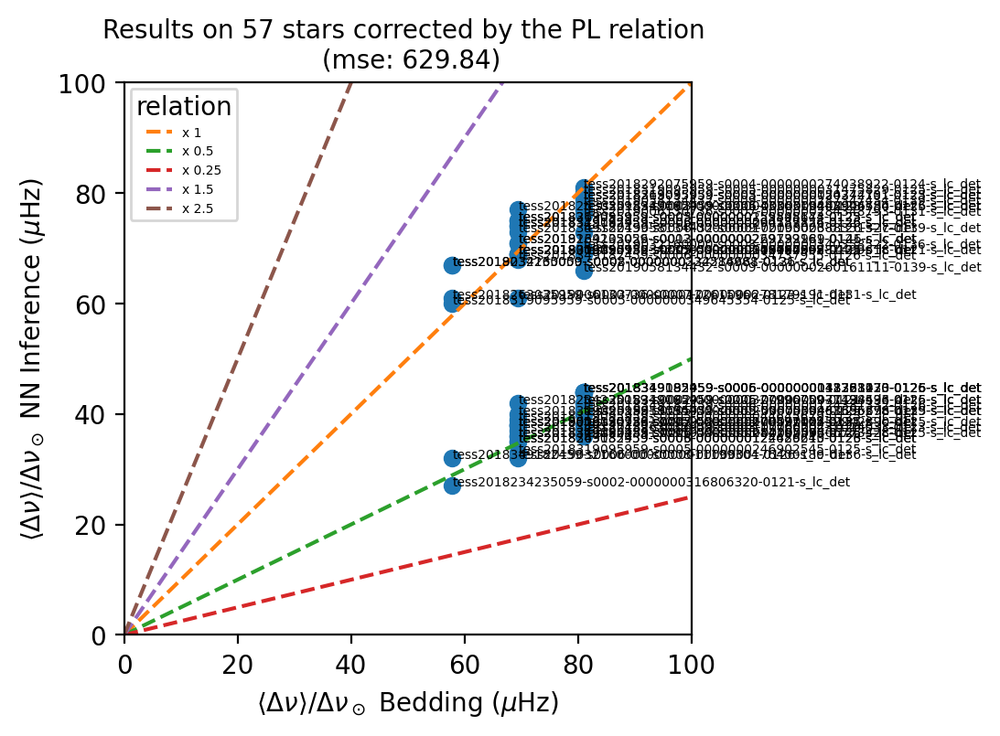

In [60]:
#### Prepare data plot
targets = results_bedding["dnu-target"]
inferences = results_bedding["best-top"]
ids = results_bedding["id"]

# Set lims
plt.subplots(1, figsize=(4, 4), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
abline(1.5, 0)
abline(2.5, 0)
plt.legend(title="relation", fontsize=5)
plt.xlabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$ Bedding ($\mu$Hz)")
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$ NN Inference ($\mu$Hz)")
plt.title("Results on 57 stars corrected by the PL relation \n (mse: %s)" % np.round(np.mean(np.power(np.asarray(targets)-np.asarray(inferences), 2)),2), fontsize=10)
plt.show()

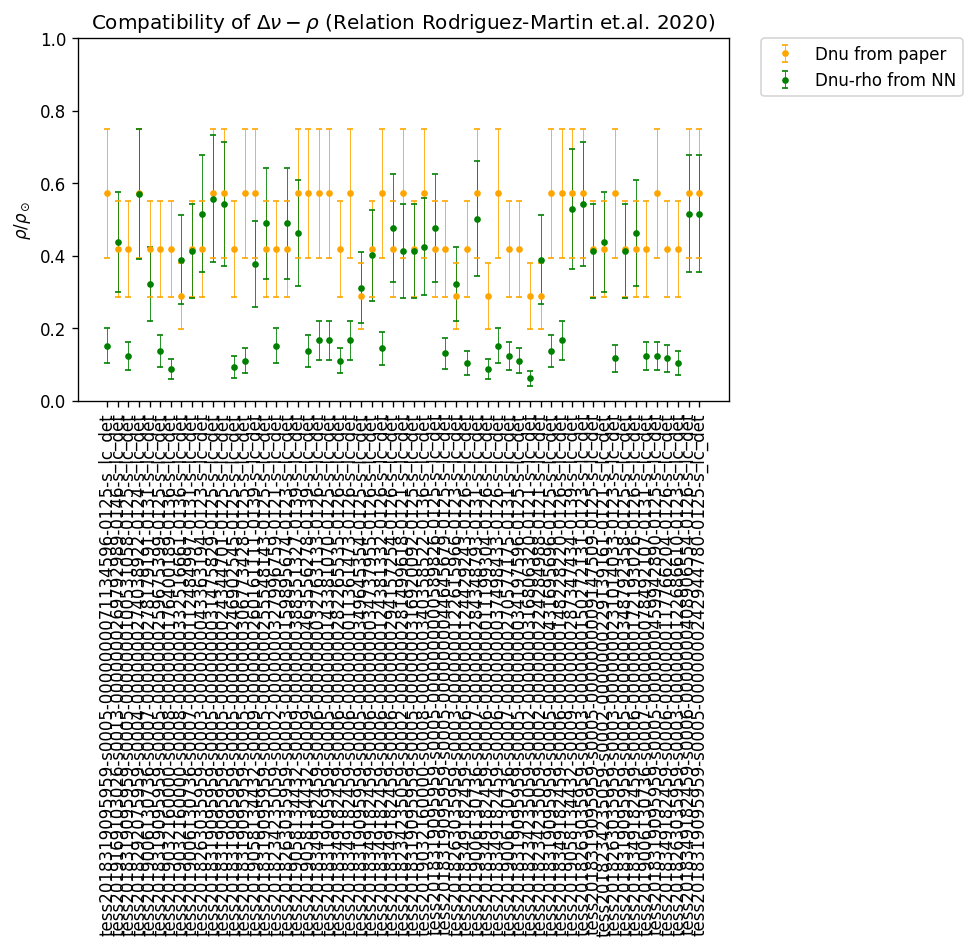

In [61]:
plt.subplots(1, figsize=(7, 4), dpi=120)

plt.errorbar(
    ids,
    get_rho(targets / dnu_sun),
    rho_error(np.float64(targets / dnu_sun)),
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="Dnu from paper"
)

plt.errorbar(
    ids,
    get_rho(inferences / dnu_sun),
    rho_error(np.float64(inferences / dnu_sun)),
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="Dnu-rho from NN"
)

plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0)
#plt.gca().add_artist(legend1)

plt.ylabel("$\\rho / \\rho_\\odot$")
plt.title("Compatibility of $\Delta\\nu-\\rho$ (Relation Rodriguez-Martin et.al. 2020)")
plt.ylim(0, 1.0)
plt.show()

In [62]:
# Get inferenes "close" to targets and create a True/Flase flag
sign = np.abs(np.asarray(targets) - np.asarray(inferences)) < 10
vals = np.asarray(targets, dtype=float)[sign==True] 

# Get stars in stars_fundamental_mode list mode
list_stars_in_fundamental_model = [(i, i in stars_fundamental_mode) for i in df[sign]["id"].values]
import pprint
print(pprint.pformat(list_stars_in_fundamental_model))

# Get percentage
print("Percentage of stars radial mode in NN inference: %f" % (sum([i in stars_fundamental_mode for i in df[sign]["id"].values]) / len(stars_fundamental_mode)))

[('tess2019169103026-s0013-0000000269792989-0146-s_lc_det', False),
 ('tess2018292075959-s0004-0000000274038922-0124-s_lc_det', True),
 ('tess2019006130736-s0007-0000000278179191-0131-s_lc_det', False),
 ('tess2019032160000-s0008-0000000332516661-0136-s_lc_det', True),
 ('tess2019006130736-s0007-0000000112484997-0131-s_lc_det', False),
 ('tess2018263035959-s0003-0000000043363194-0123-s_lc_det', True),
 ('tess2018319095959-s0005-0000000031475829-0125-s_lc_det', False),
 ('tess2018319095959-s0005-0000000024344701-0125-s_lc_det', False),
 ('tess2018319095959-s0005-0000000255548143-0125-s_lc_det', True),
 ('tess2018263035959-s0003-0000000159895674-0123-s_lc_det', True),
 ('tess2019058134432-s0009-0000000388351327-0139-s_lc_det', True),
 ('tess2018319095959-s0005-0000000349645354-0125-s_lc_det', False),
 ('tess2018349182459-s0006-0000000034737955-0126-s_lc_det', False),
 ('tess2018349182459-s0006-0000000294157254-0126-s_lc_det', True),
 ('tess2018319095959-s0005-0000000316920092-0125-s_lc_d

In [63]:
sign = np.abs(np.asarray(targets) - np.asarray(inferences)) < 10
np.count_nonzero(sign)

vals = np.asarray(targets, dtype=float)[sign==True] 

df[sign==True]

,id,dnu-target,top1,e-top1,top2,e-top2,top3,e-top3,top4,e-top4,dnu-from-P-up-fromstarmodel,dnu-from-P-down-fromstarmodel,dnu-from-P-up,dnu-from-P-down
1,tess2019169103026-s0013-0000000269792989-0146-...,69.444444,71,1.262247,31,1.067596,54,1.074314,20,1.462074,NaN,NaN,NaN,NaN
3,tess2018292075959-s0004-0000000274038922-0124-...,81.018519,81,1.032950,37,1.343976,25,1.095920,67,1.278432,67.119157,36.513418,78.528288,43.278586
4,tess2019006130736-s0007-0000000278179191-0131-...,69.444444,38,2.534777,61,1.014434,76,2.832986,21,1.270569,89.824792,50.013793,93.471066,52.193418
7,tess2019032160000-s0008-0000000332516661-0136-...,57.870370,30,1.599047,67,1.567963,54,1.290611,43,2.647982,82.787839,45.814681,80.266927,44.313175
8,tess2019006130736-s0007-0000000112484997-0131-...,69.444444,36,2.209089,69,1.172194,21,1.186692,95,0.955620,72.031127,39.420439,78.528288,43.278586
9,tess2018263035959-s0003-0000000043363194-0123-...,69.444444,77,1.180074,35,1.051584,56,1.271015,95,1.188352,73.233508,40.133400,79.806657,44.039208
10,tess2018319095959-s0005-0000000031475829-0125-...,81.018519,40,1.334071,80,1.041860,68,1.270300,24,1.398529,66.843317,36.350455,77.786247,42.837287
11,tess2018319095959-s0005-0000000024344701-0125-...,81.018519,79,1.043326,43,1.021916,94,1.049515,67,1.744769,NaN,NaN,NaN,NaN
15,tess2018319095959-s0005-0000000255548143-0125-...,69.444444,75,1.004229,35,1.787321,55,1.411078,90,1.121688,80.526145,44.467495,80.068831,44.195255
17,tess2018263035959-s0003-0000000159895674-0123-...,69.444444,75,1.968248,37,2.914482,97,0.658845,19,1.758654,69.503467,37.923343,75.101286,41.241885
